# REGIONAL REGRASJONSANALYSE AV TOTALT TILSIG/MAGASINVOLUM
## Tipper/predikerer foregående ukes verdi
Dette scriptet utfører en estimering det totale tilsiget (ukjent+kjent) i hver av regionene: NO1-NO5 og SE1-SE4. Tippingen på tilsig og/eller magasin er basert på regresjon fra en mengde kjente serier for bla. tilsig og magasinvolum. Tippingen skrives til seriene regest% (søk i tidsserier). 

Beskrivelse av metoden:
1. Leser inn kjente serier for tilsig og/eller magasinvolum fra SMG, og henter ukesverdiene. Dette gjøres i egen celle slik at man kan kun trenger å lese inn en gang siden dette tar noen minutter.
2. Leser inn fasiten, og regner så ut korrelasjonen (R2) mellom faiten og inputseriene. Et antall serier som skal tas med videre velges så utifra "ant_kandidater" med høyeste korrelasjon med fasiten.
3. Kjøre regresjon så langt tilbake som vi har data (2015.06.08), og luker ut den høyeste p-verdien. Dette kjøres om og om igjen helt til den høyeste p-verdien er laveren enn "max_p".
4. Til slutt kjøres en regresjon på en kortere periode (reg_period) med utvalget av serier som har blitt gjort i steg 2 og 3. Resultatet fra denne regresjonen blir modellen som brukes til å estimere/tippe neste ukes verdi.
5. Scriptet gjør 10 slike tippinger, 10 uker tilbake i tid, for hver kjøring. 

Tuning av regresjonen utføres ved å spesifisere ant_kandidater, max_p og reg_period, som når man er fornøyd kan oppdateres i default_input_variables. For at dette skal bli brukt i autojobben, må man ta kontakt med Sarah, slik at dette kan legges inn i PyCharm scriptet som utfører autojobben (tirsdag 06:00 og 11:00).

Scriptet er laget av Sarah Gjermo, på bestilling fra Svein Farstad. Sist endret 06.05.2019.

## INNLESNING OG KLARGJØRING
Kjøres kun en gang!

In [4]:
from regression_modules import *

auto_input = {}
auto_input['tilsig'] = read_and_setup('tilsig')
auto_input['magasin'] = read_and_setup('magasin')

---------------------------------------------------------------
                        TILSIG                                 
---------------------------------------------------------------
Forventet innlesingstid er +/-180 sekunder.
Leser nå NO1..
Leser nå NO2..
Leser nå NO3..
Leser nå NO4..
Leser nå NO5..
Leser nå SE1..
Leser nå SE2..
Leser nå SE3..
Leser nå SE4..
Leser nå Tilsig kjente pr prisområde..
Leser nå Tilsig ukjente pr prisområde..
Leser nå BesteEstimat, Q_obse, Q_NFB..
Leser nå Tilsig basert på magasinendring pluss Kpp-prod, Del1..
Leser nå Del2..
Leser nå Del3..
Leser nå Del4..
Leser nå Del5..
Leser nå Tilsiget pr kraftverksområde: Del1..
Leser nå Del2..
Leser nå Del3..
Leser nå Del4..
Leser nå Del5..
Leser nå Del6..
Leser nå NVE1..
Leser nå NVE2..
Leser nå NVE3..
Leser nå NVE4..
Leser nå NVE5..
Leser nå NVE6..
Leser nå NVE7..
Mandag det tippes for (siste mandag ved tuning):  2019.07.15

-------------------Feil i kjente tilsig verdier--------------------
-44.86 /Skel-Sl

## KJØRING
Her kan du velge å kjøre regresjonen for alle regioner, og for magasin og tilsig i ett f.eks, slik:

    var = ['Magasin','Tilsig']
    reg = ['NO1','NO2','NO3','NO4','NO5','SE1','SE2','SE3','SE4']
    for variable in var:
        for region in reg:
            show_result_input = make_estimate_and_write(variable, region, auto_input[variable])
            show_result(show_result_input)

\\energycorp\applications\OSL\jupyter_notebooks\personalfolders\u39545_Sarah\RegresjonsEstimering\regression_modules.py:197: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df.dropna(axis=1, how='any', inplace=True)



Skriver estimerte verdier til:  RegEstimatMagNO1...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO1.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO1.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.08.03 til: 2019.07.15, satt til 206 uker.
Valgte 94 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99986
R2 mellom fasit og tipping: 0.99995

Fasit:
 2019-06-24 00:00:00+01:00    80.700000
2019-07-01 00:00:00+01:00    80.499986
2019-07-08 00:00:00+01:00    80.487699
2019-07-15 00:00:00+01:00    79.443440
Name: /Norg-NO1.Fasit.....-U9104A5R-0132, dtype: float64

Moddelert/Tippet:
 2019-06-17 00:00:00+01:00   

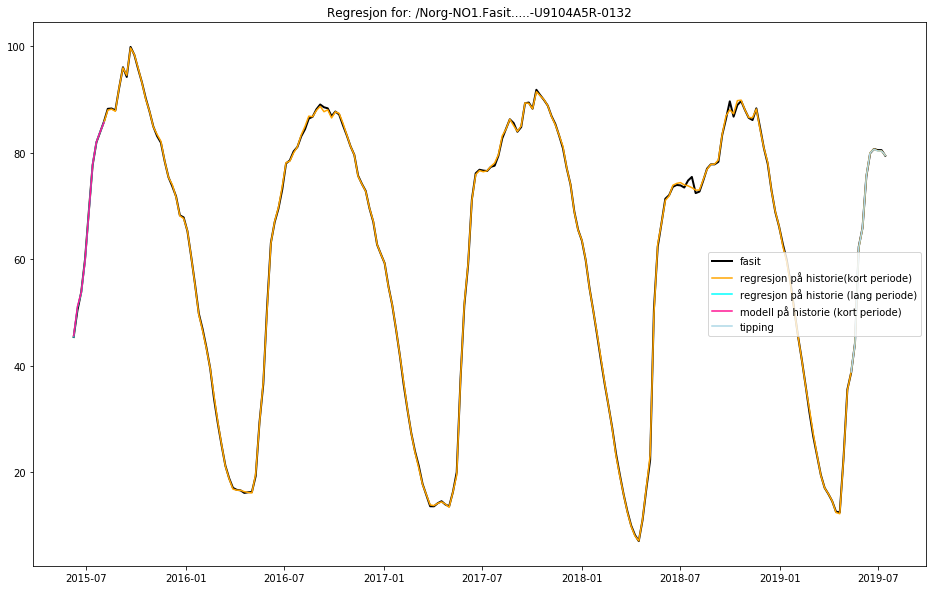

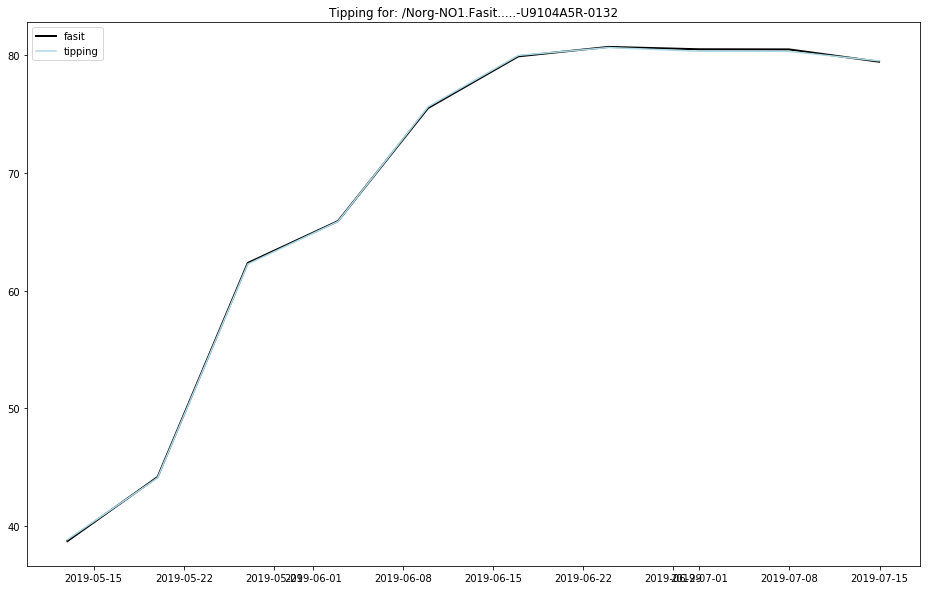

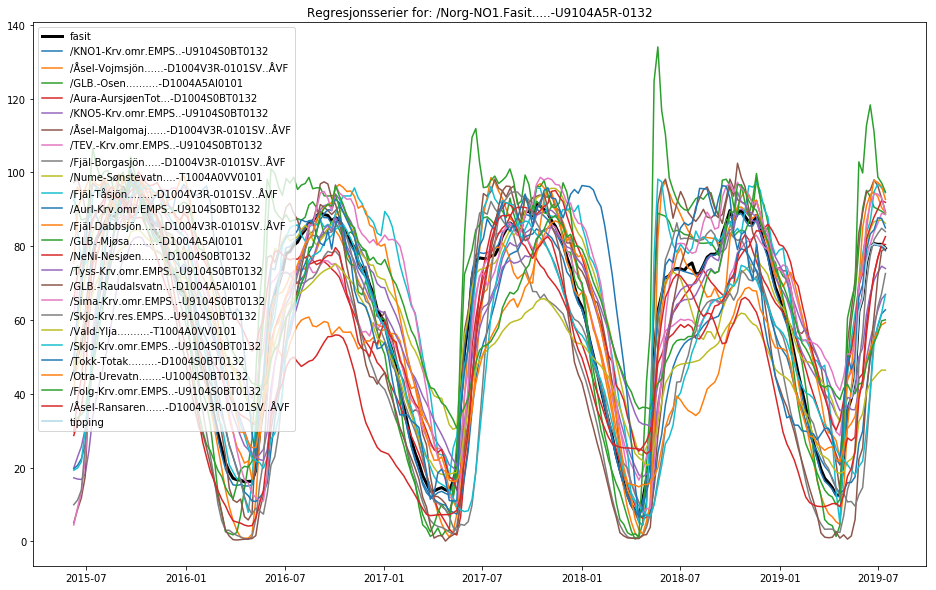


Skriver estimerte verdier til:  RegEstimatMagNO2...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO2.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO2.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.10.12 til: 2019.07.15, satt til 196 uker.
Valgte 66 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99993
R2 mellom fasit og tipping: 0.99994

Fasit:
 2019-06-24 00:00:00+01:00    72.100000
2019-07-01 00:00:00+01:00    73.300033
2019-07-08 00:00:00+01:00    74.402675
2019-07-15 00:00:00+01:00    73.923128
Name: /Norg-NO2.Fasit.....-U9104A5R-0132, dtype: float64

Moddelert/Tippet:
 2019-06-17 00:00:00+01:00   

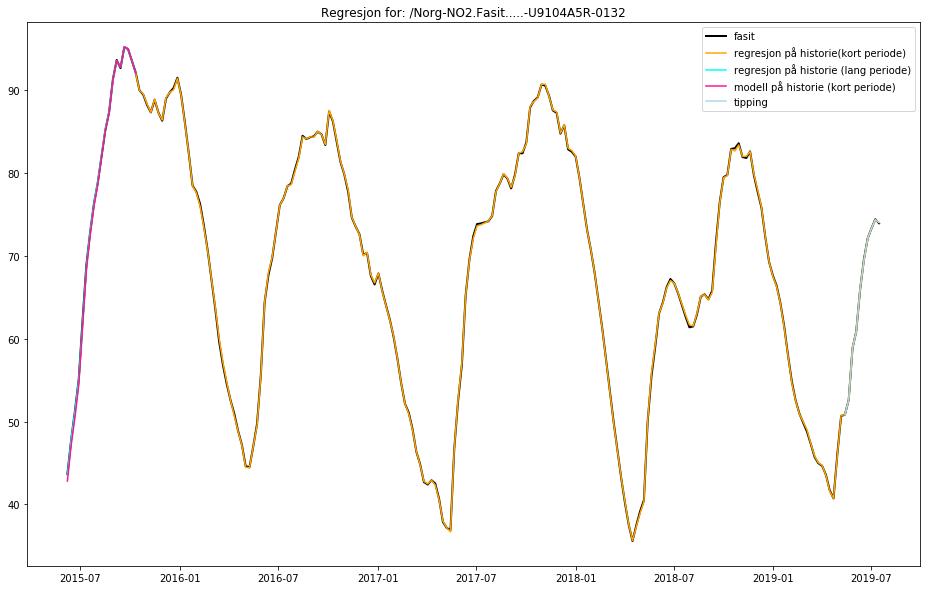

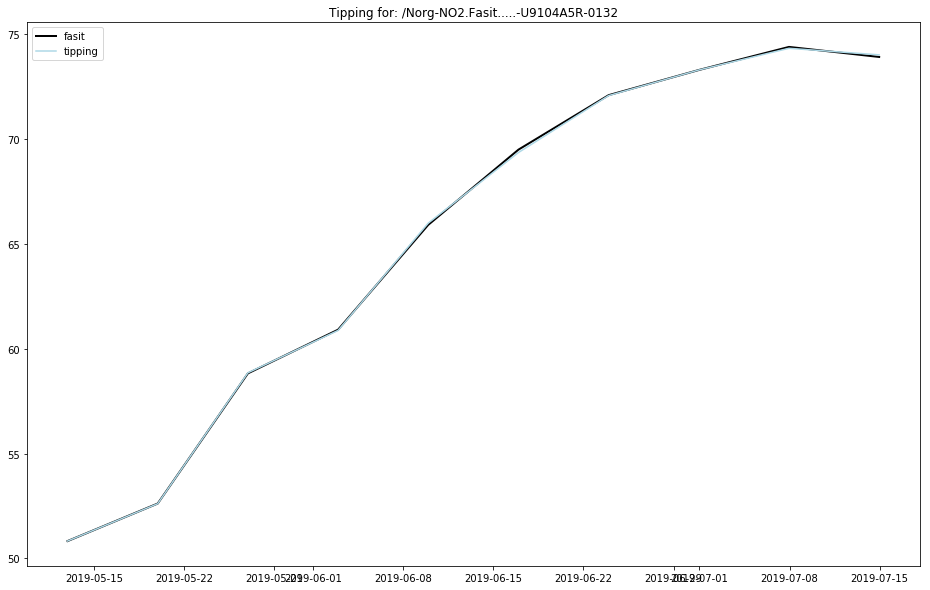

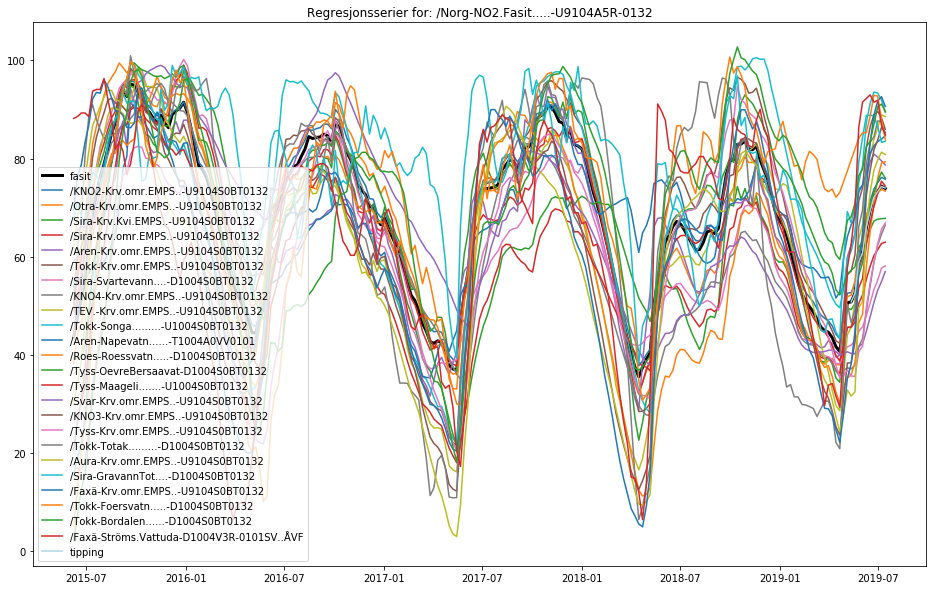


Skriver estimerte verdier til:  RegEstimatMagNO3...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO3.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO3.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2018.07.23 til: 2019.07.15, satt til 51 uker.
Valgte 110 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99997
R2 mellom fasit og tipping: 0.99980

Fasit:
 2019-06-24 00:00:00+01:00    78.099991
2019-07-01 00:00:00+01:00    79.999956
2019-07-08 00:00:00+01:00    82.813315
2019-07-15 00:00:00+01:00    82.127885
Name: /Norg-NO3.Fasit.....-U9104A5R-0132, dtype: float64

Moddelert/Tippet:
 2019-06-17 00:00:00+01:00   

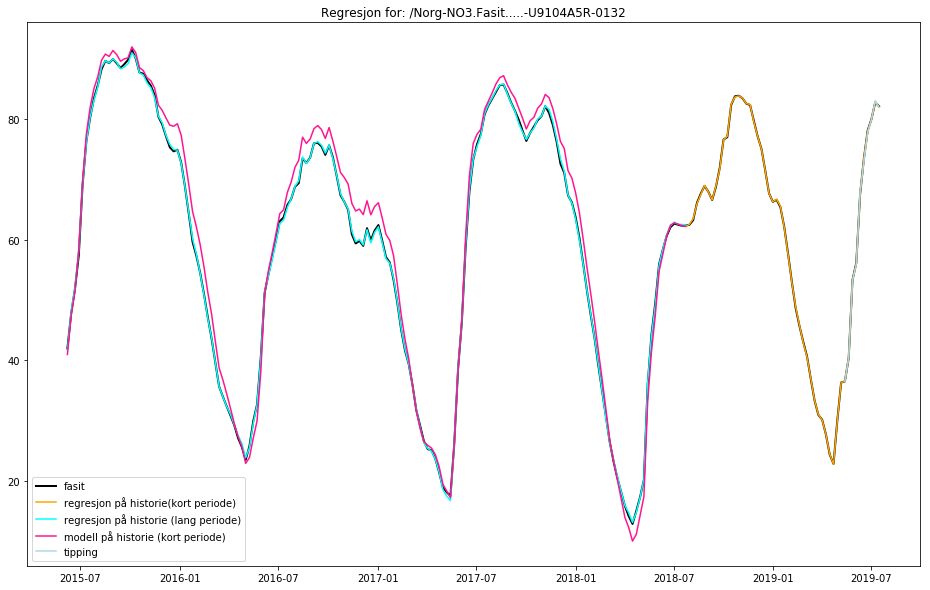

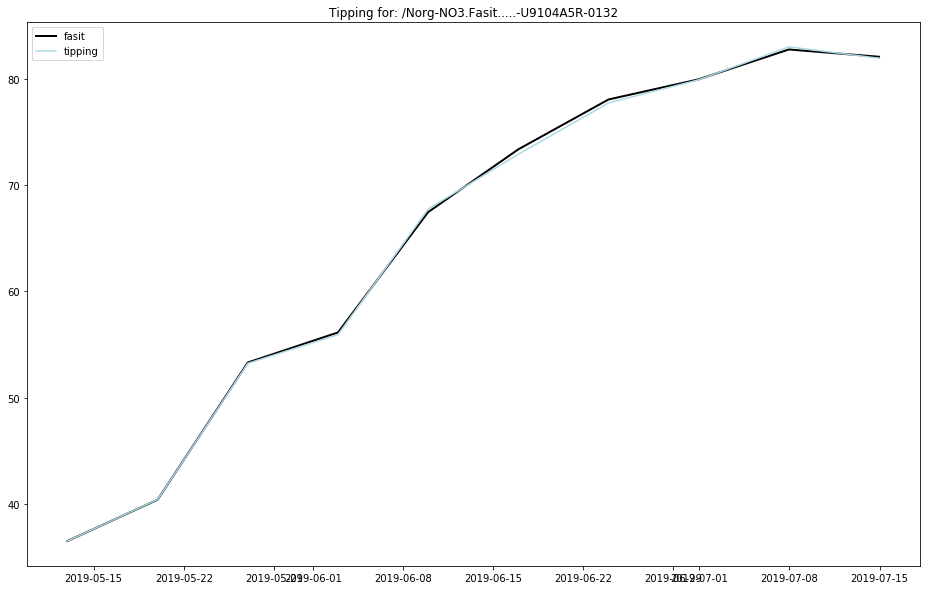

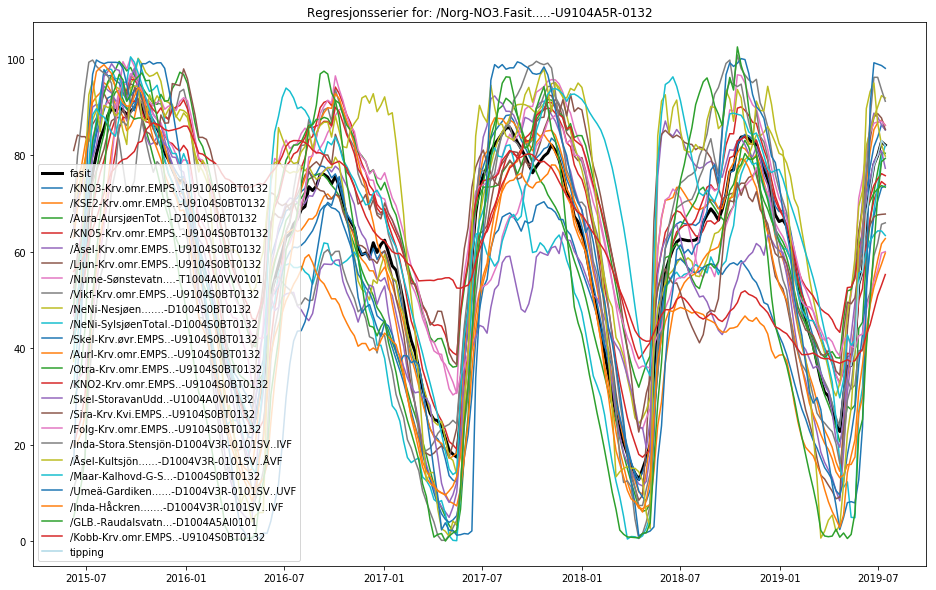


Skriver estimerte verdier til:  RegEstimatMagNO4...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO4.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO4.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2017.10.30 til: 2019.07.15, satt til 89 uker.
Valgte 80 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99991
R2 mellom fasit og tipping: 0.99986

Fasit:
 2019-06-24 00:00:00+01:00    59.399987
2019-07-01 00:00:00+01:00    63.300166
2019-07-08 00:00:00+01:00    65.311243
2019-07-15 00:00:00+01:00    67.240369
Name: /Norg-NO4.Fasit.....-U9104A5R-0132, dtype: float64

Moddelert/Tippet:
 2019-06-17 00:00:00+01:00    

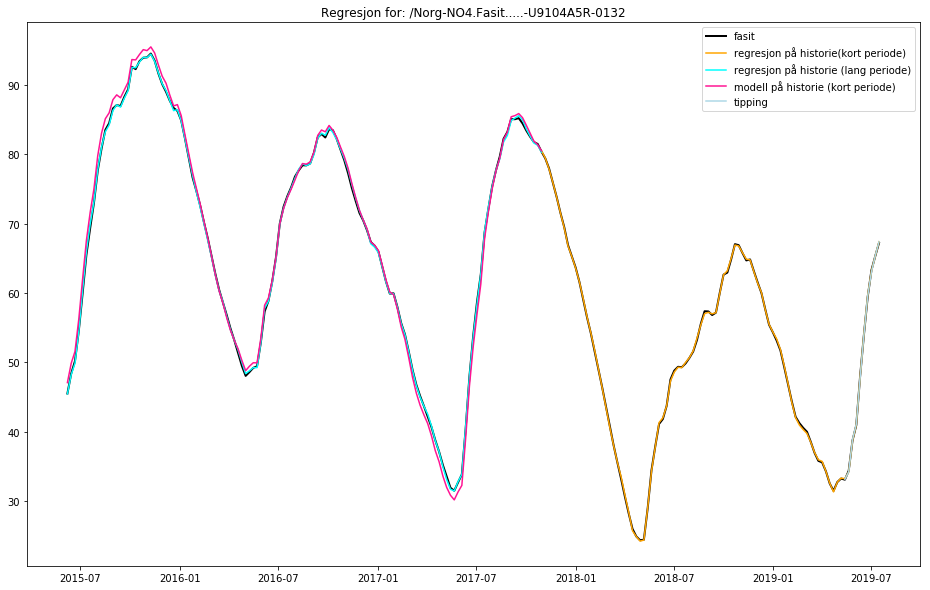

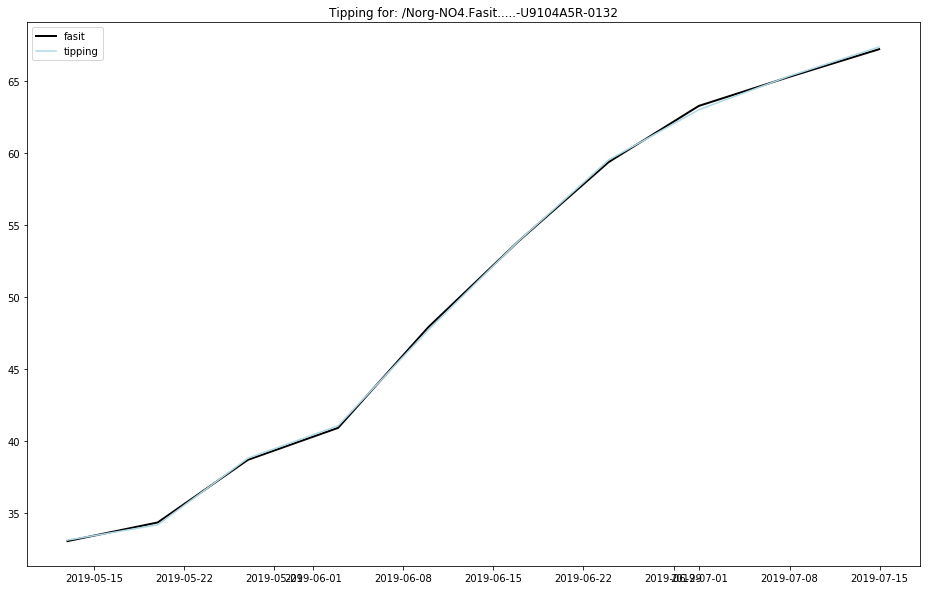

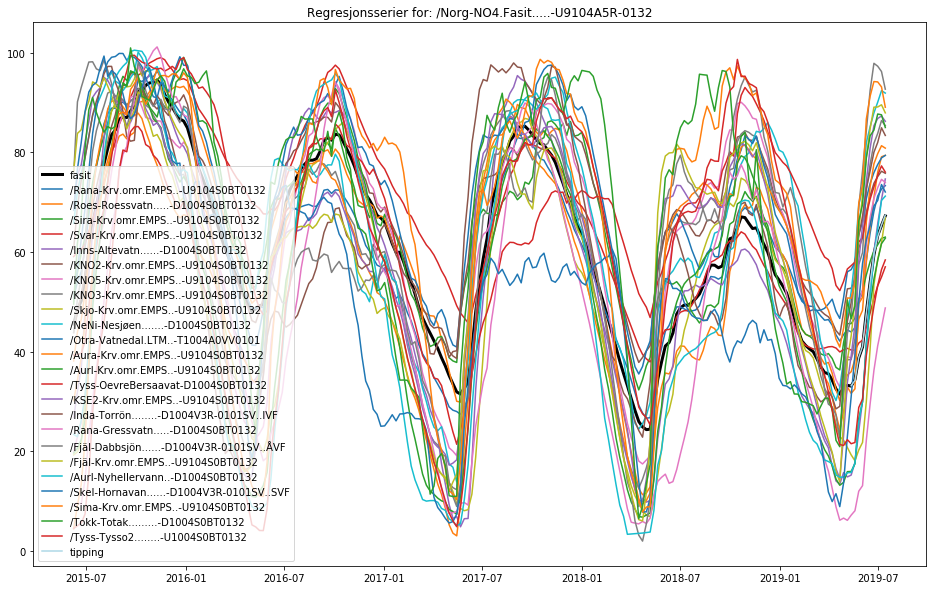


Skriver estimerte verdier til:  RegEstimatMagNO5...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO5.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO5.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2017.12.11 til: 2019.07.15, satt til 83 uker.
Valgte 115 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99995
R2 mellom fasit og tipping: 0.99994

Fasit:
 2019-06-24 00:00:00+01:00    62.599994
2019-07-01 00:00:00+01:00    65.200093
2019-07-08 00:00:00+01:00    67.646813
2019-07-15 00:00:00+01:00    67.465559
Name: /Norg-NO5.Fasit.....-U9104A5R-0132, dtype: float64

Moddelert/Tippet:
 2019-06-17 00:00:00+01:00   

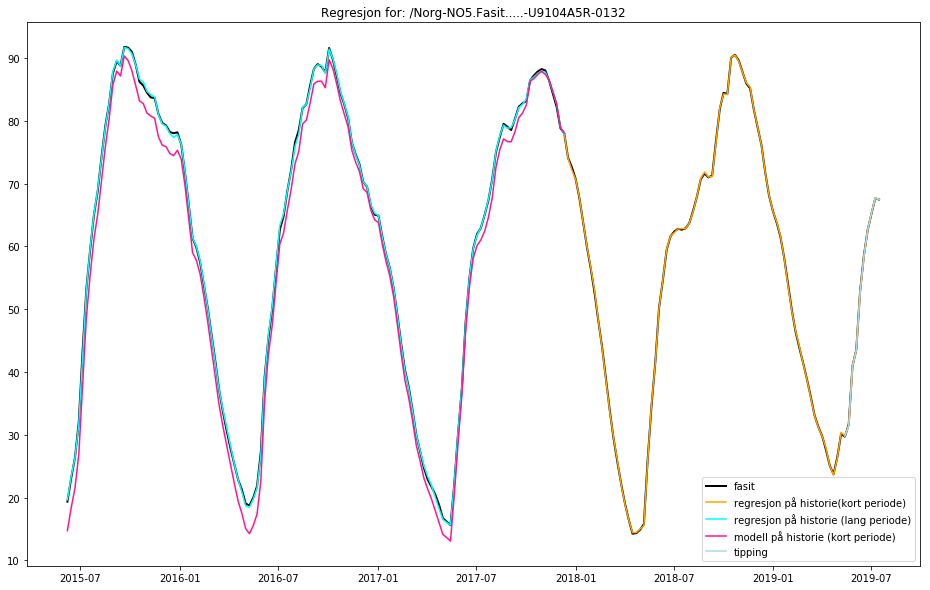

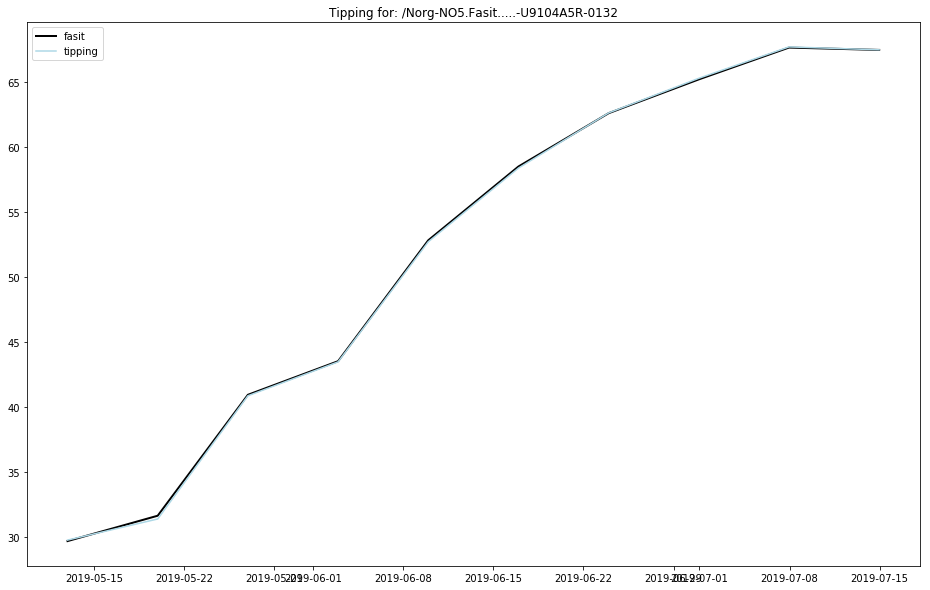

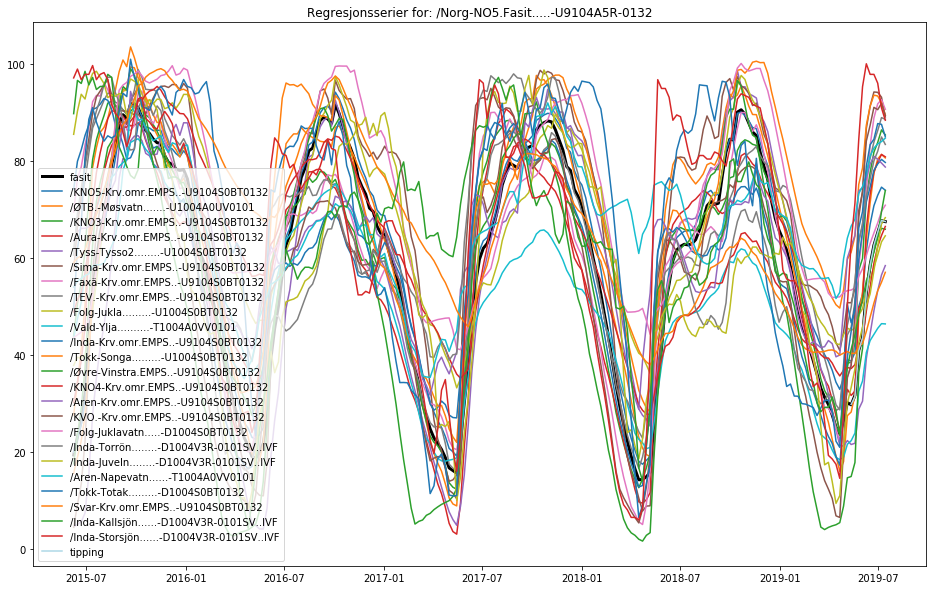


Skriver estimerte verdier til:  RegEstimatMagSE1...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE1.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE1.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.08.10 til: 2019.07.15, satt til 205 uker.
Valgte 56 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99920
R2 mellom fasit og tipping: 0.99888

Fasit:
 2019-06-24 00:00:00+01:00    57.0
2019-07-01 00:00:00+01:00    62.8
2019-07-08 00:00:00+01:00    66.8
2019-07-15 00:00:00+01:00    69.5
Name: /Sver-SE1.Fasit.....-U9104A5R-0132, dtype: float64

Moddelert/Tippet:
 2019-06-17 00:00:00+01:00    48.311401
2019-06-2

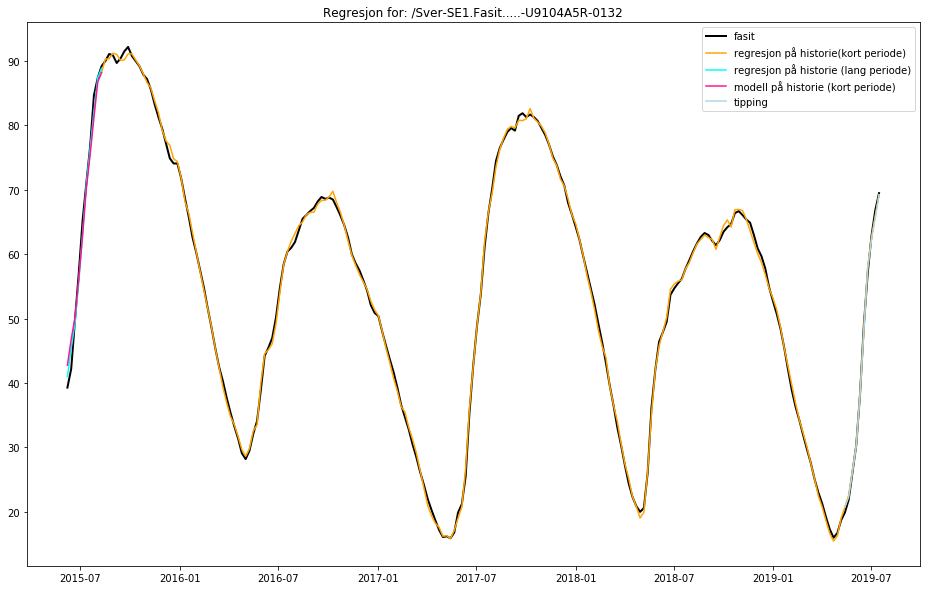

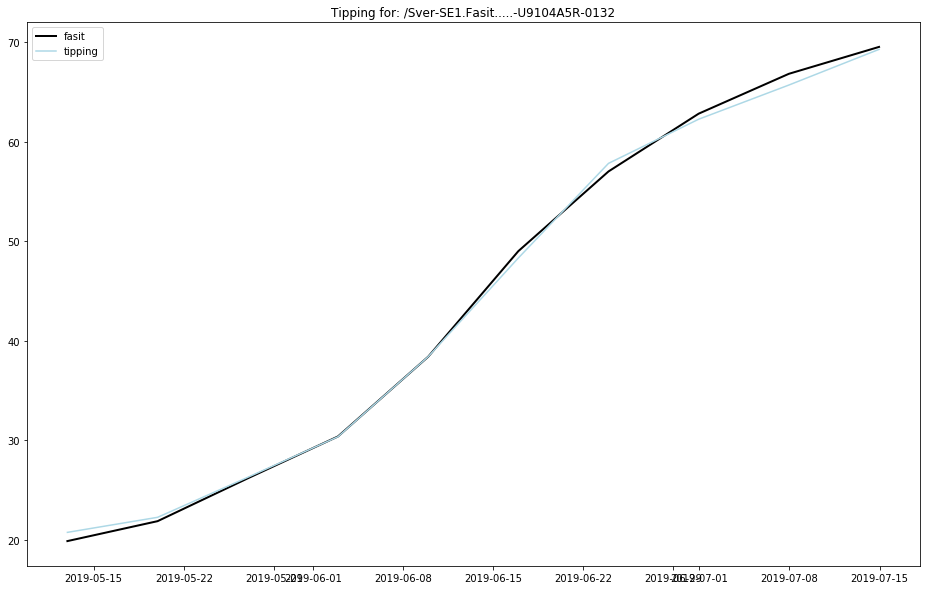

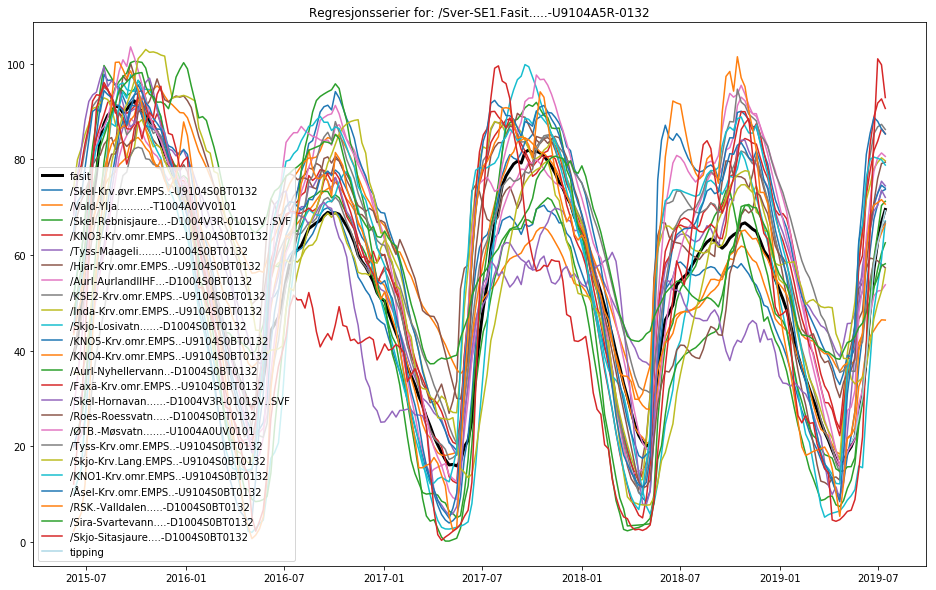


Skriver estimerte verdier til:  RegEstimatMagSE2...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE2.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE2.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2018.01.22 til: 2019.07.15, satt til 77 uker.
Valgte 74 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99997
R2 mellom fasit og tipping: 0.99988

Fasit:
 2019-06-24 00:00:00+01:00    85.0
2019-07-01 00:00:00+01:00    86.3
2019-07-08 00:00:00+01:00    86.7
2019-07-15 00:00:00+01:00    85.6
Freq: W-SUN, Name: /Sver-SE2.Fasit.....-U9104A5R-0132, dtype: float64

Moddelert/Tippet:
 2019-06-17 00:00:00+01:00    81.2130

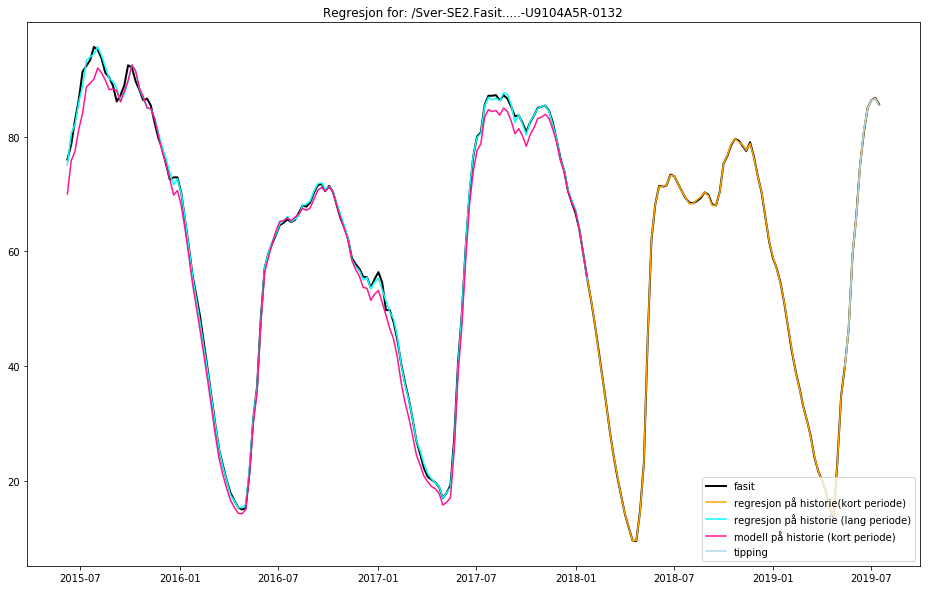

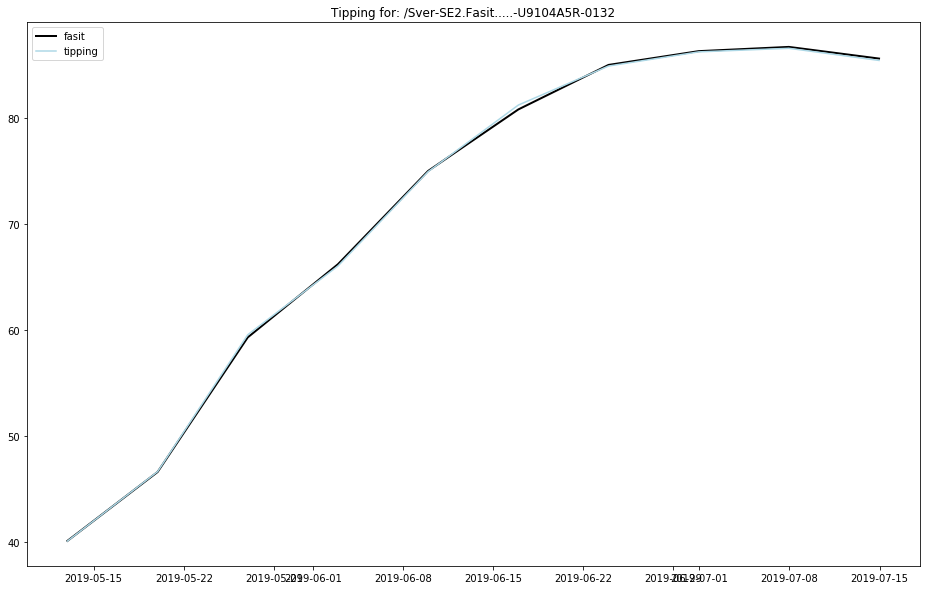

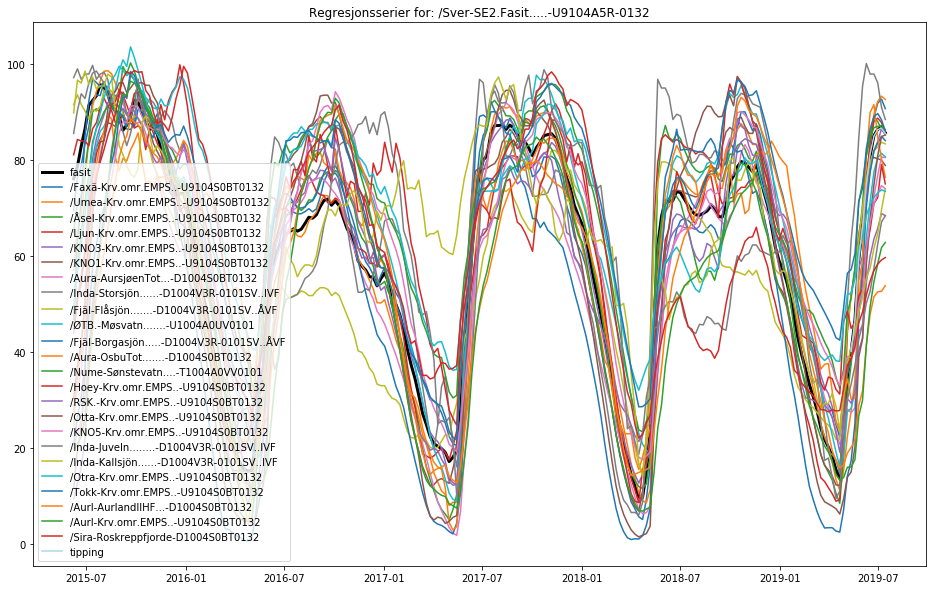


Skriver estimerte verdier til:  RegEstimatMagSE3...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE3.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE3.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.12.07 til: 2019.07.15, satt til 188 uker.
Valgte 85 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99314
R2 mellom fasit og tipping: 0.99261

Fasit:
 2019-06-24 00:00:00+01:00    79.1
2019-07-01 00:00:00+01:00    78.6
2019-07-08 00:00:00+01:00    78.4
2019-07-15 00:00:00+01:00    77.1
Freq: W-SUN, Name: /Sver-SE3.Fasit.....-U9104A5R-0132, dtype: float64

Moddelert/Tippet:
 2019-06-17 00:00:00+01:00    77.989

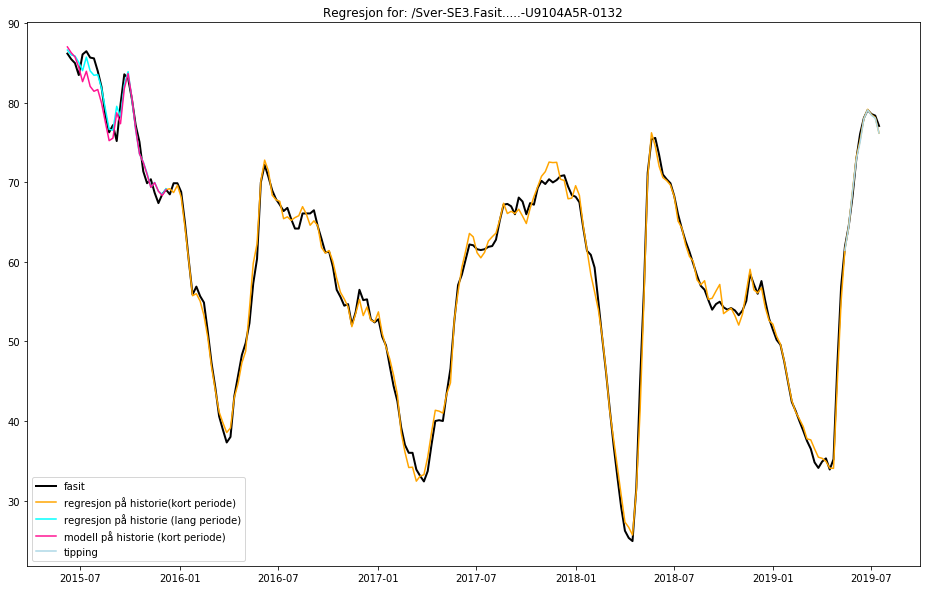

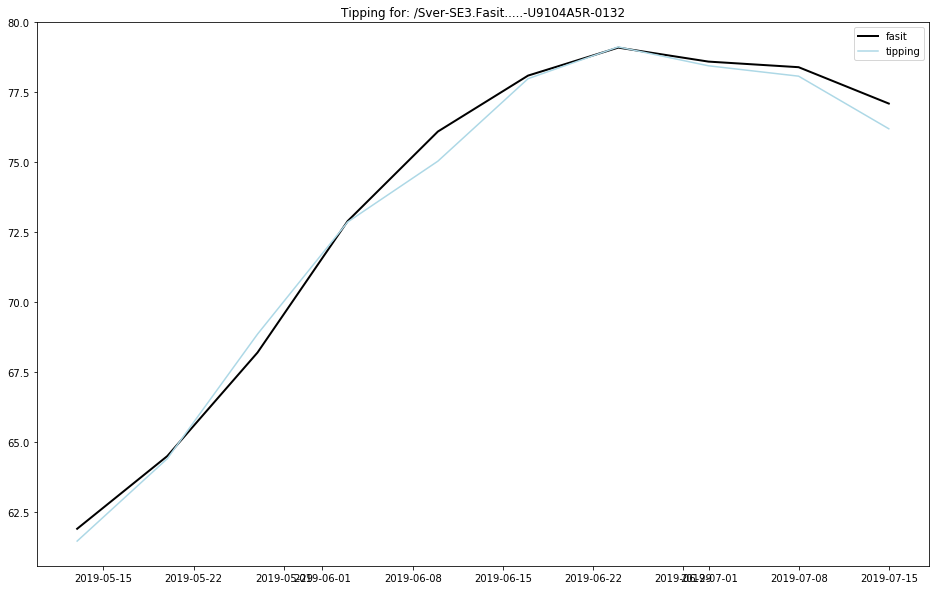

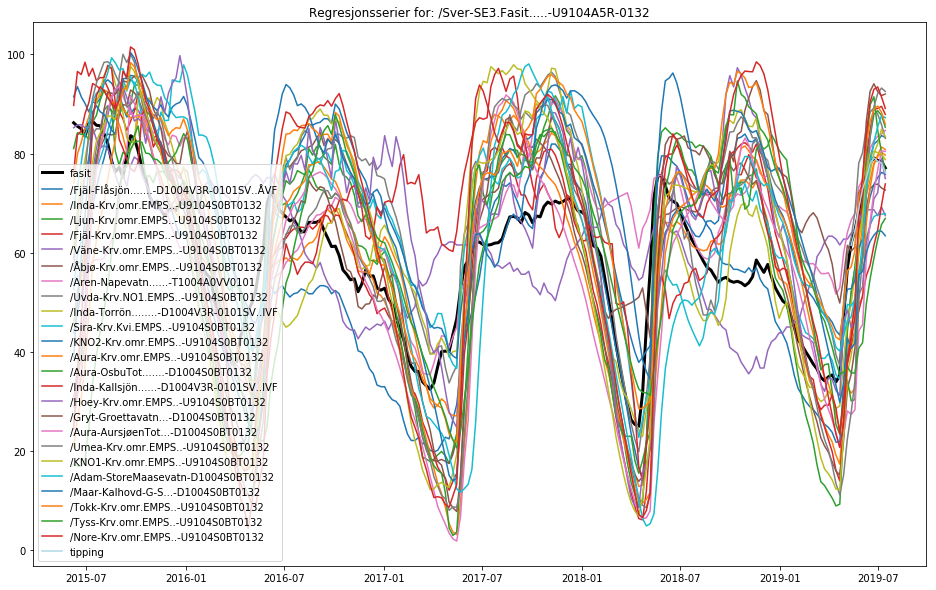


Skriver estimerte verdier til:  RegEstimatMagSE4...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE4.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE4.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2016.01.18 til: 2019.07.15, satt til 182 uker.
Valgte 95 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99715
R2 mellom fasit og tipping: 0.96430

Fasit:
 2019-06-24 00:00:00+01:00    58.0
2019-07-01 00:00:00+01:00    54.9
2019-07-08 00:00:00+01:00    52.7
2019-07-15 00:00:00+01:00    51.3
Freq: W-SUN, Name: /Sver-SE4.Fasit.....-U9104A5R-0132, dtype: float64

Moddelert/Tippet:
 2019-06-17 00:00:00+01:00    61.026

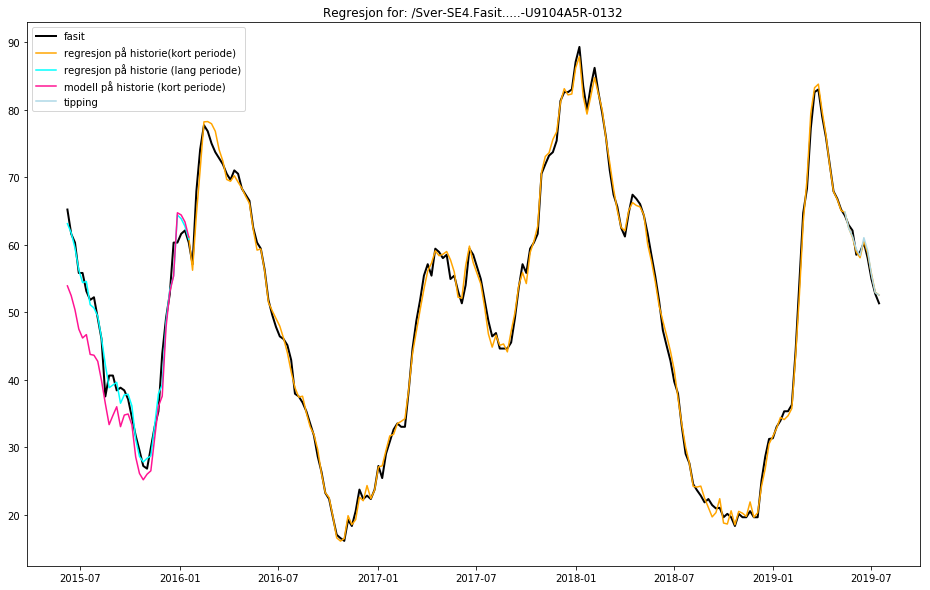

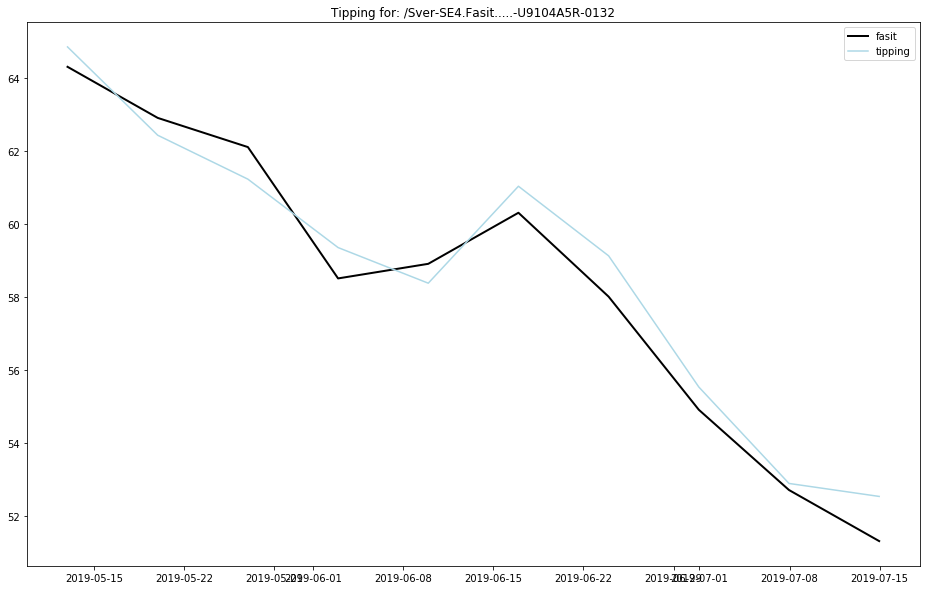

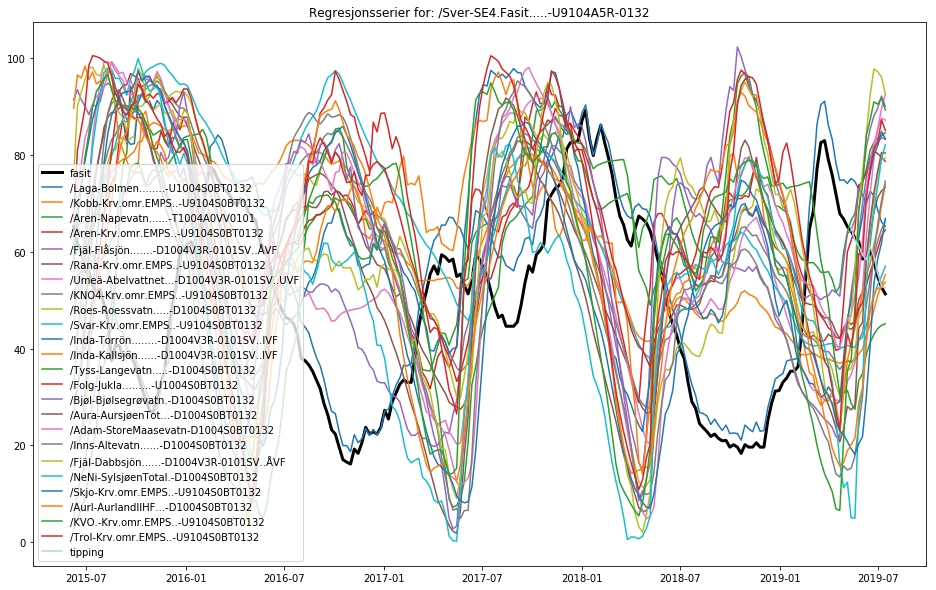


Skriver estimerte verdier til:  RegEstimatTilsigNO1-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO1.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No1.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.08.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2019.02.25 til: 2019.07.08, satt til 19 uker.
Valgte 145 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 9 stk.
R2 for regresjonen (kort periode): 0.99937
R2 mellom fasit og tipping: 0.98976

Fasit:
 2019-06-17 00:00:00+01:00    496.720029
2019-06-24 00:00:00+01:00    373.105170
2019-07-01 00:00:00+01:00    315.036952
2019-07-08 00:00:00+01:00    213.388763
Freq: W-SUN, Name: /Norg-No1.Fasit.....-U9100S0BT0105, dtype: float64

Moddelert/Tippet:
 2019-06-10 00:0

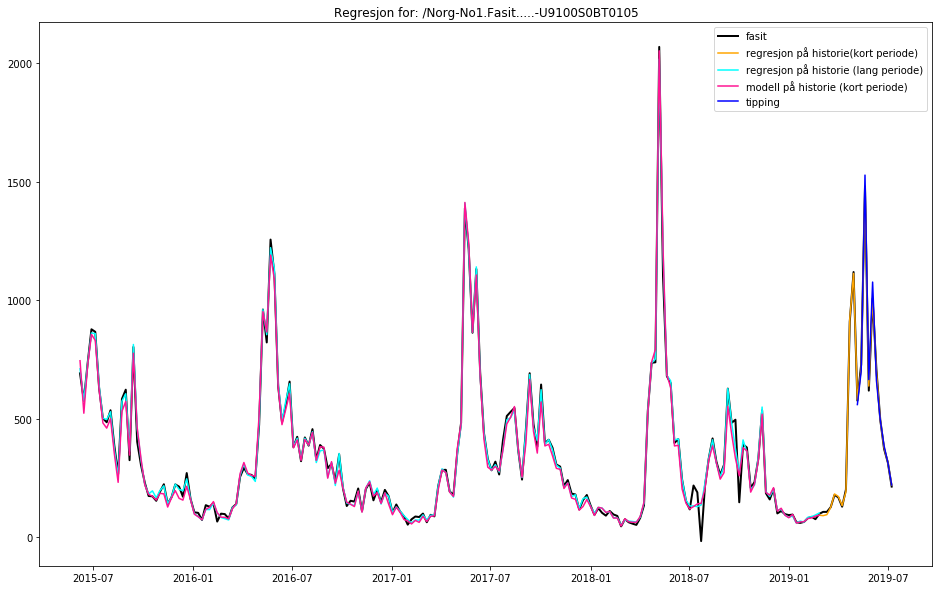

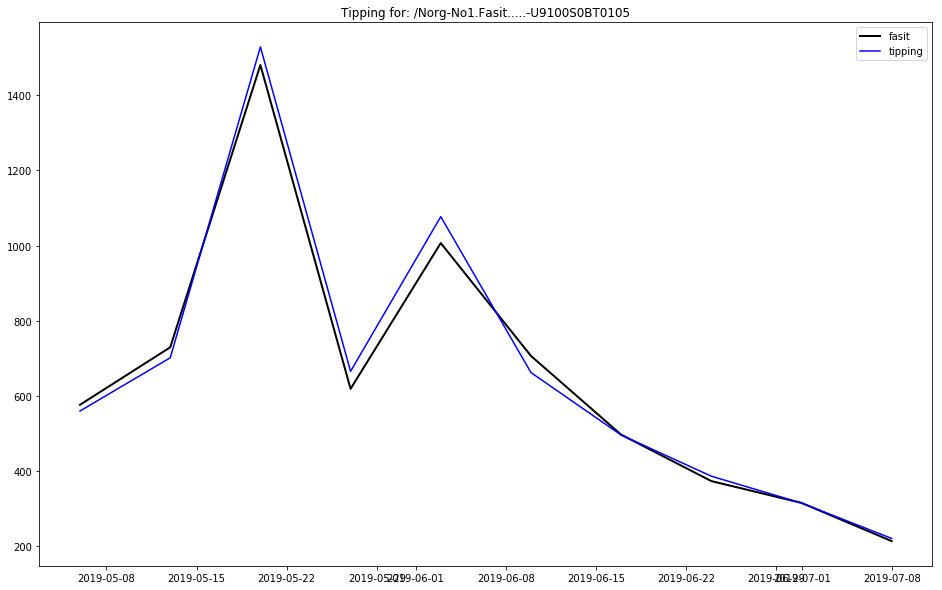

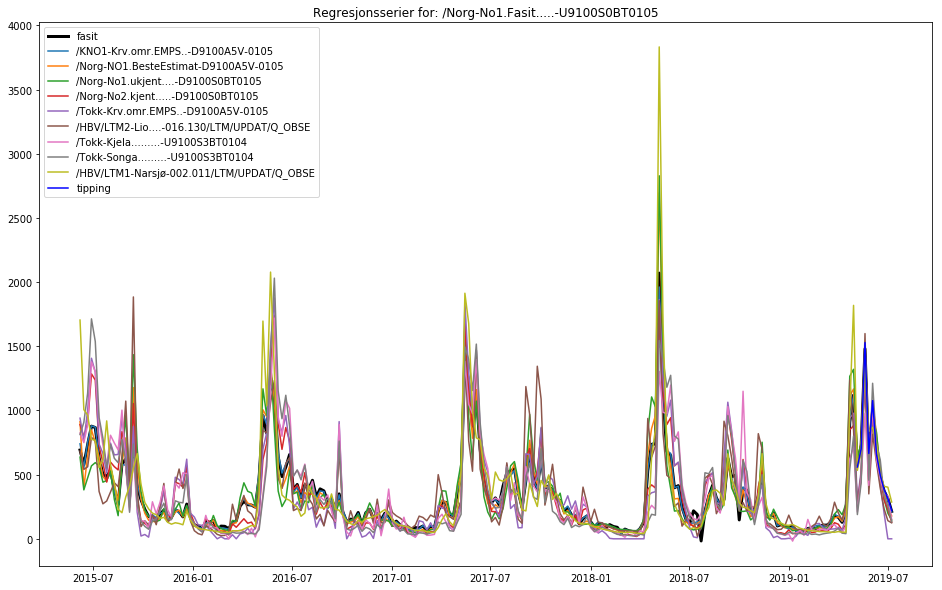


Skriver estimerte verdier til:  RegEstimatTilsigNO2-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO2.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No2.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.08.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2017.12.18 til: 2019.07.08, satt til 81 uker.
Valgte 161 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
R2 for regresjonen (kort periode): 0.99893
R2 mellom fasit og tipping: 0.99019

Fasit:
 2019-06-17 00:00:00+01:00    1315.956316
2019-06-24 00:00:00+01:00     802.215654
2019-07-01 00:00:00+01:00     773.573751
2019-07-08 00:00:00+01:00     352.240303
Freq: W-SUN, Name: /Norg-No2.Fasit.....-U9100S0BT0105, dtype: float64

Moddelert/Tippet:
 2019-06-10

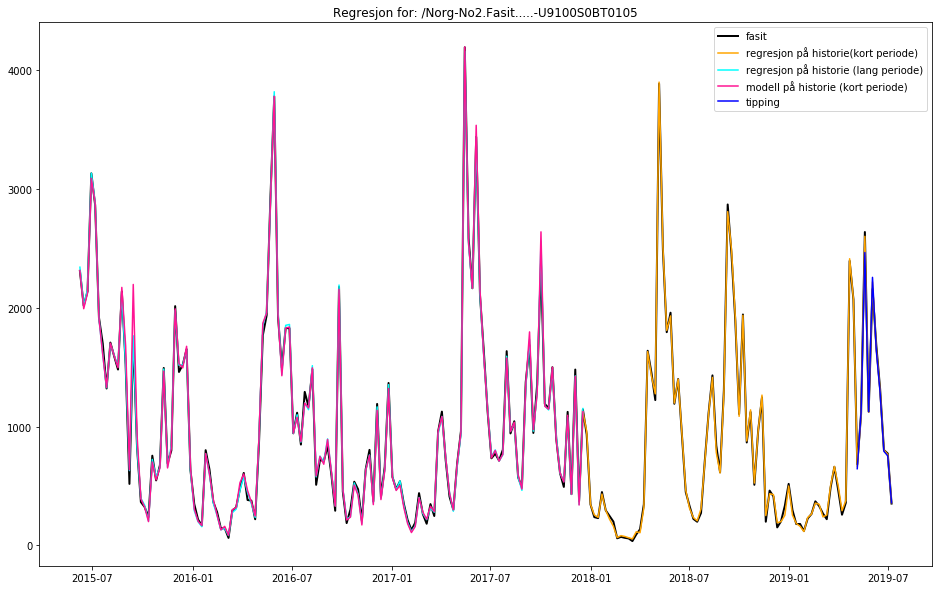

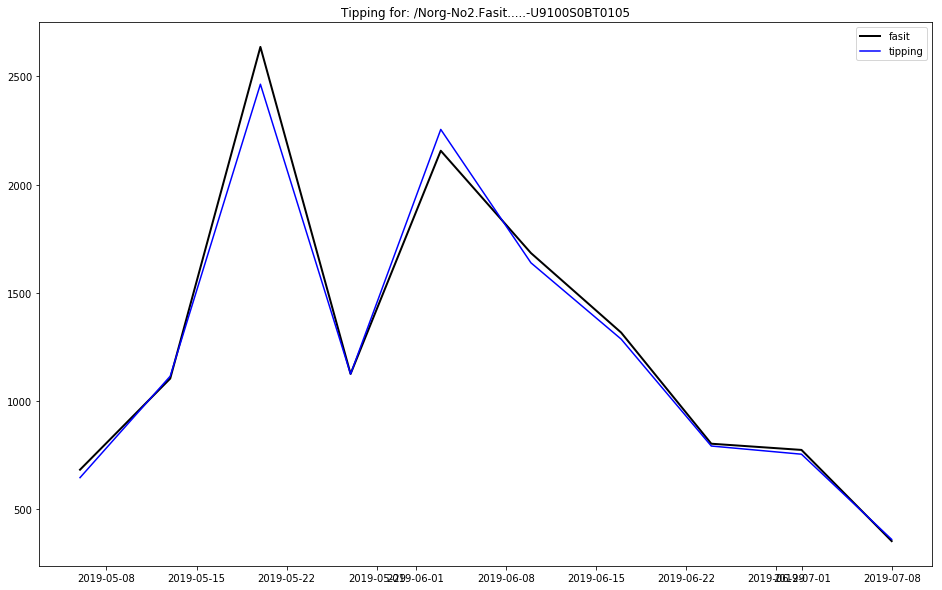

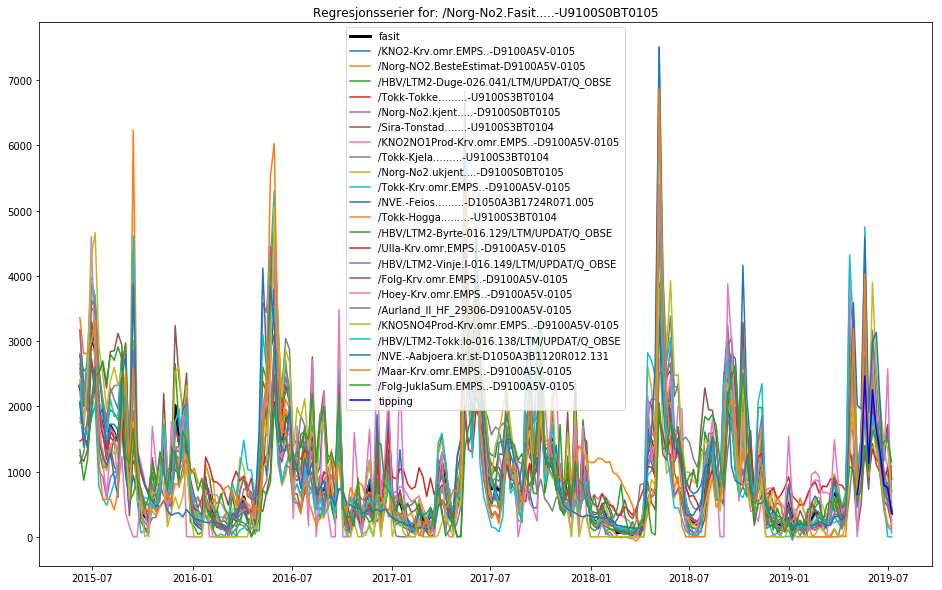


Skriver estimerte verdier til:  RegEstimatTilsigNO3-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO3.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No3.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.08.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2016.01.18 til: 2019.07.08, satt til 181 uker.
Valgte 138 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99759
R2 mellom fasit og tipping: 0.99709

Fasit:
 2019-06-17 00:00:00+01:00    769.831967
2019-06-24 00:00:00+01:00    529.347168
2019-07-01 00:00:00+01:00    670.436283
2019-07-08 00:00:00+01:00    312.112163
Freq: W-SUN, Name: /Norg-No3.Fasit.....-U9100S0BT0105, dtype: float64

Moddelert/Tippet:
 2019-06-10 00

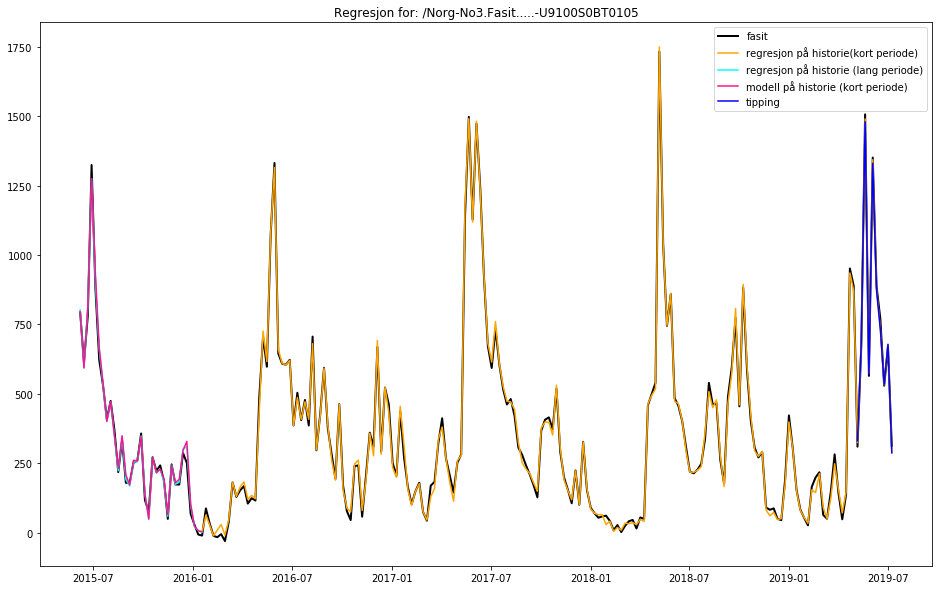

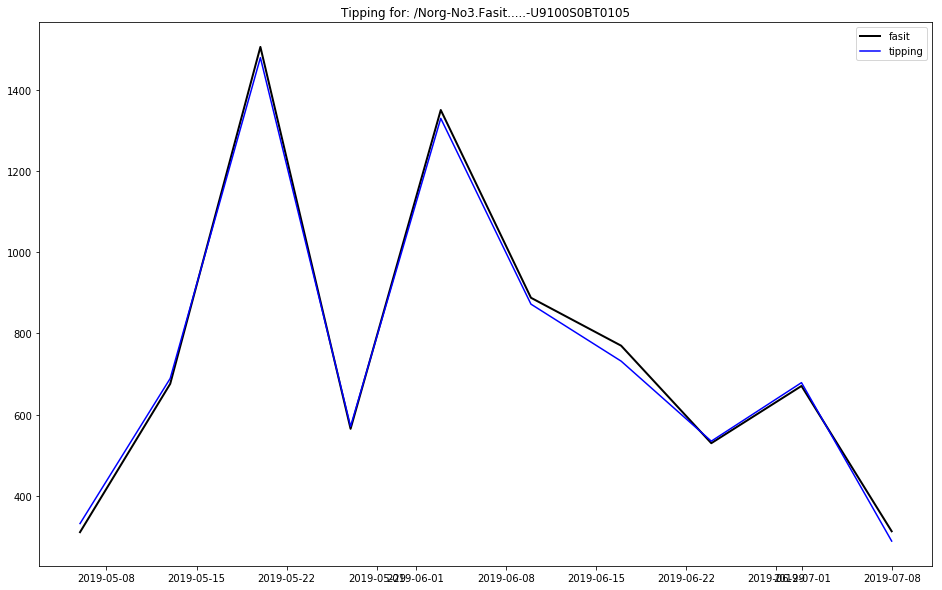

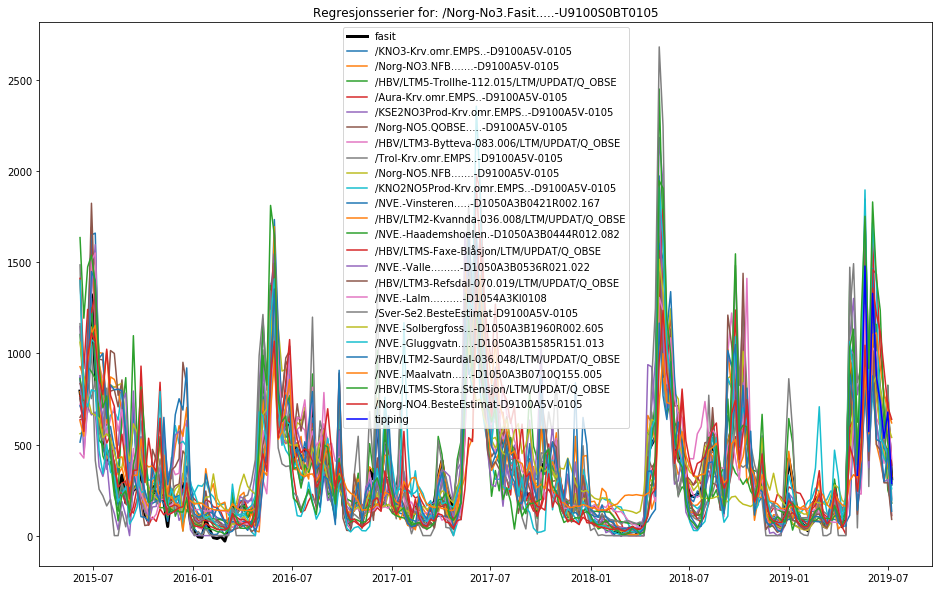


Skriver estimerte verdier til:  RegEstimatTilsigNO4-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO4.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No4.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.08.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2017.03.13 til: 2019.07.08, satt til 121 uker.
Valgte 145 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
R2 for regresjonen (kort periode): 0.99856
R2 mellom fasit og tipping: 0.99779

Fasit:
 2019-06-17 00:00:00+01:00    1446.488103
2019-06-24 00:00:00+01:00    1182.877923
2019-07-01 00:00:00+01:00     824.445974
2019-07-08 00:00:00+01:00     858.372053
Freq: W-SUN, Name: /Norg-No4.Fasit.....-U9100S0BT0105, dtype: float64

Moddelert/Tippet:
 2019-06-1

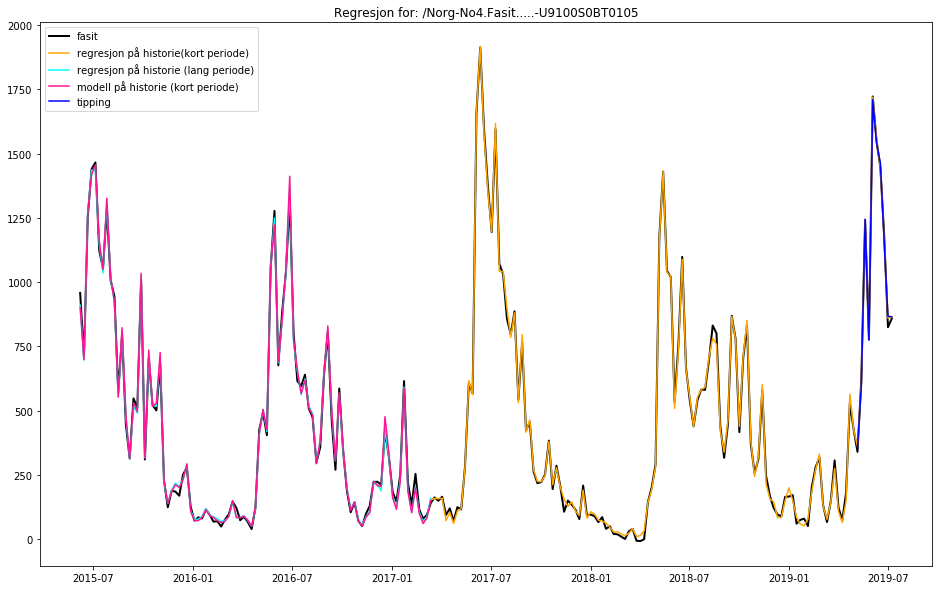

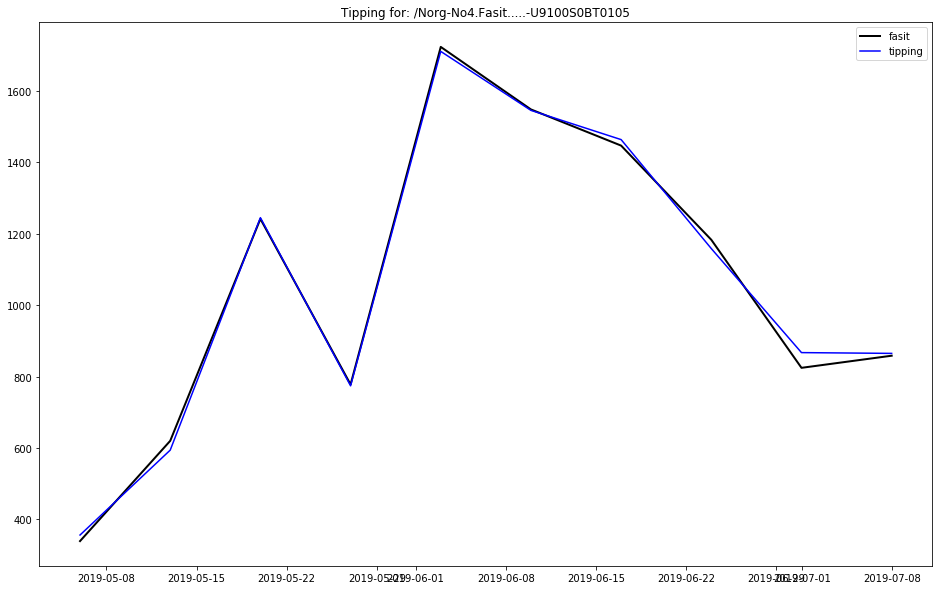

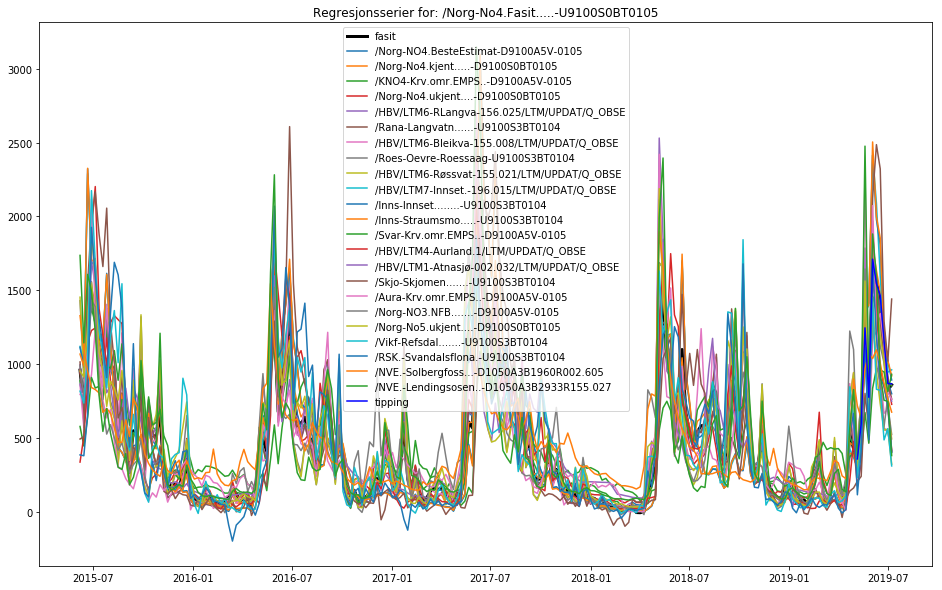


Skriver estimerte verdier til:  RegEstimatTilsigNO5-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO5.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No5.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.08.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2017.04.17 til: 2019.07.08, satt til 116 uker.
Valgte 171 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99818
R2 mellom fasit og tipping: 0.99888

Fasit:
 2019-06-17 00:00:00+01:00    1117.887063
2019-06-24 00:00:00+01:00     925.861553
2019-07-01 00:00:00+01:00     880.966094
2019-07-08 00:00:00+01:00     468.930187
Freq: W-SUN, Name: /Norg-No5.Fasit.....-U9100S0BT0105, dtype: float64

Moddelert/Tippet:
 2019-06-1

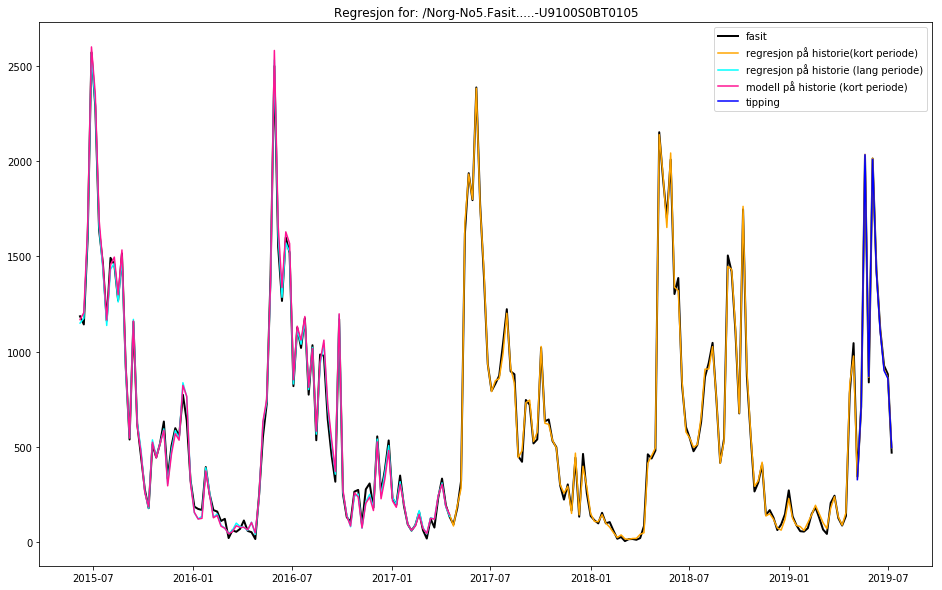

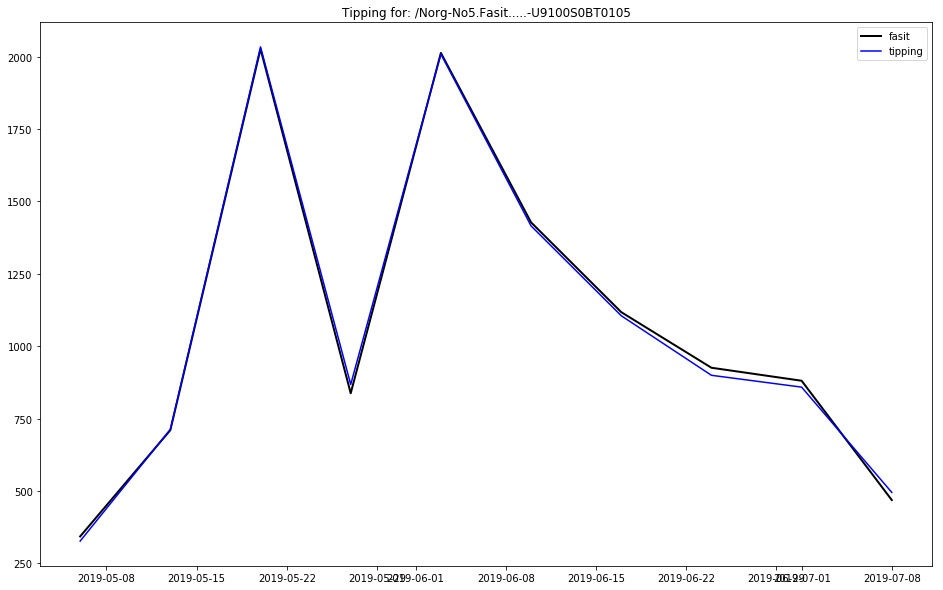

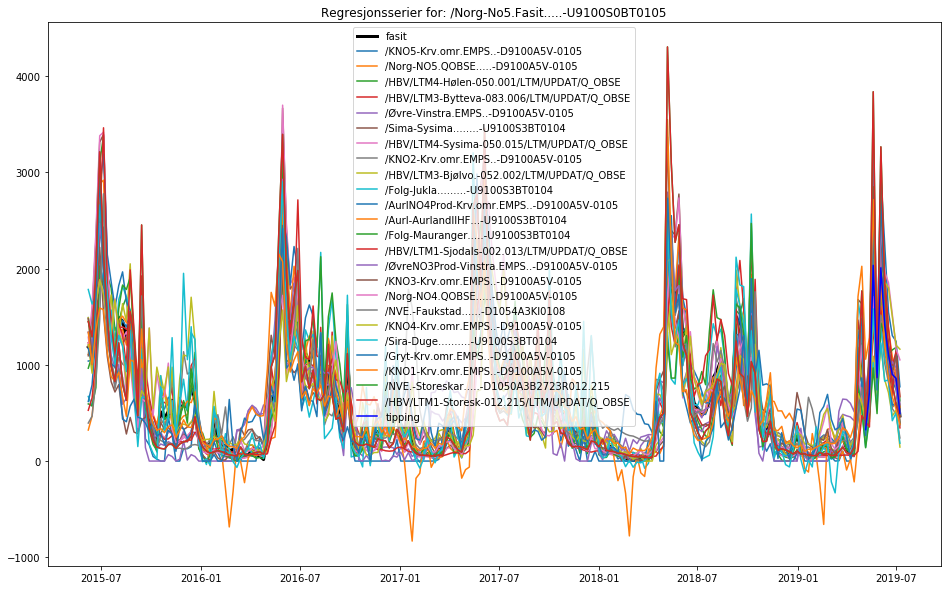


Skriver estimerte verdier til:  RegEstimatTilsigSE1-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE1.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se1.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.08.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2017.08.21 til: 2019.07.08, satt til 98 uker.
Valgte 104 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 16 stk.
R2 for regresjonen (kort periode): 0.98995
R2 mellom fasit og tipping: 0.96651

Fasit:
 2019-06-17 00:00:00+01:00    1342.22150
2019-06-24 00:00:00+01:00    1038.12796
2019-07-01 00:00:00+01:00     778.02250
2019-07-08 00:00:00+01:00     785.00124
Freq: W-SUN, Name: /Sver-Se1.Fasit.....-U9100S0BT0105, dtype: float64

Moddelert/Tippet:
 2019-06-10 00:

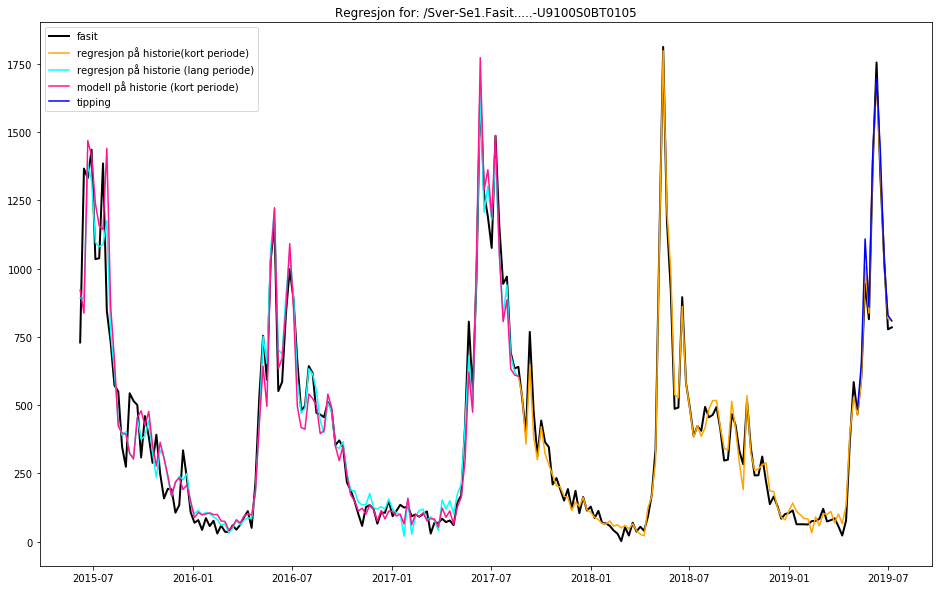

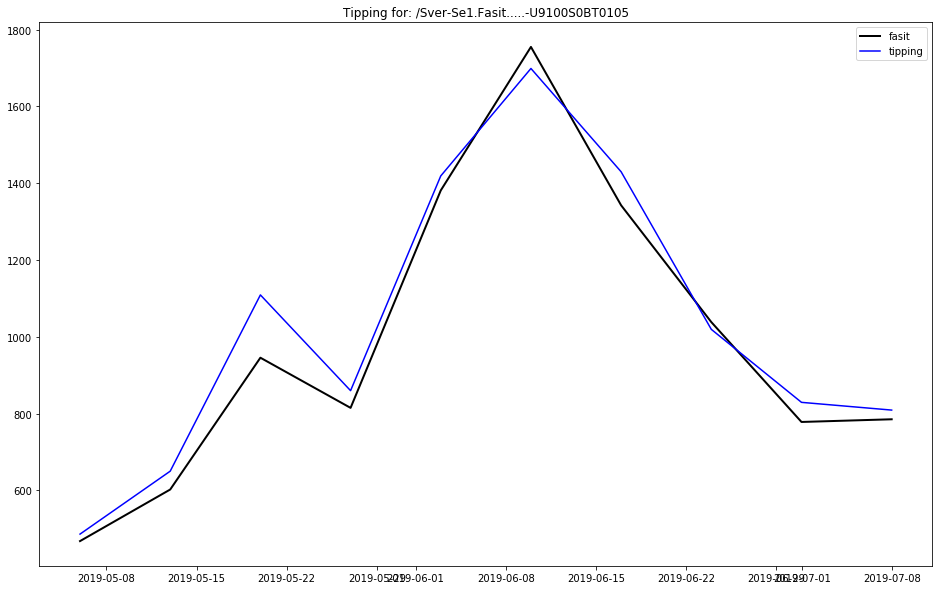

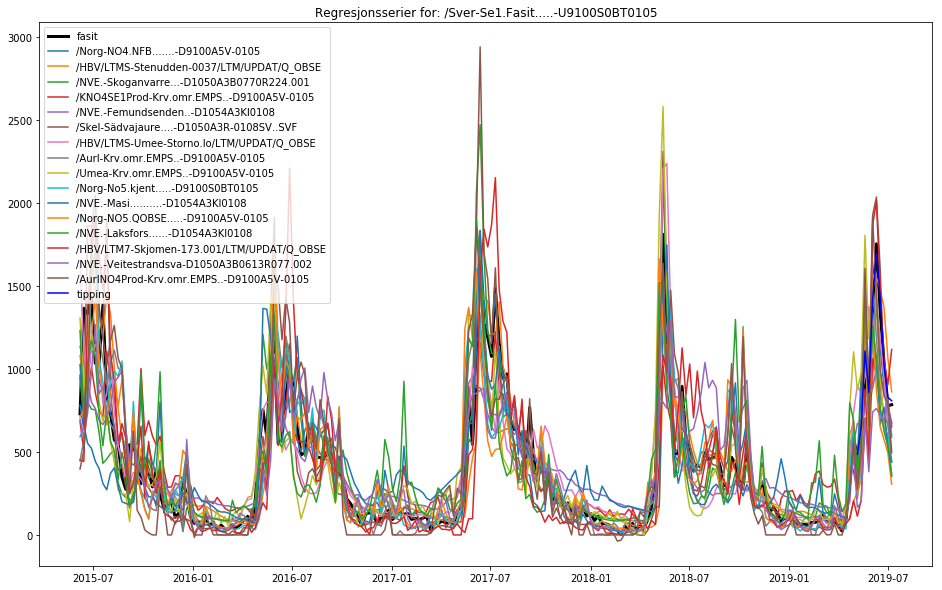


Skriver estimerte verdier til:  RegEstimatTilsigSE2-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE2.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se2.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.08.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2017.01.30 til: 2019.07.08, satt til 127 uker.
Valgte 86 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 11 stk.
R2 for regresjonen (kort periode): 0.99884
R2 mellom fasit og tipping: 0.99707

Fasit:
 2019-06-17 00:00:00+01:00    1436.88316
2019-06-24 00:00:00+01:00     974.27069
2019-07-01 00:00:00+01:00     801.05572
2019-07-08 00:00:00+01:00     594.10017
Freq: W-SUN, Name: /Sver-Se2.Fasit.....-U9100S0BT0105, dtype: float64

Moddelert/Tippet:
 2019-06-10 00:

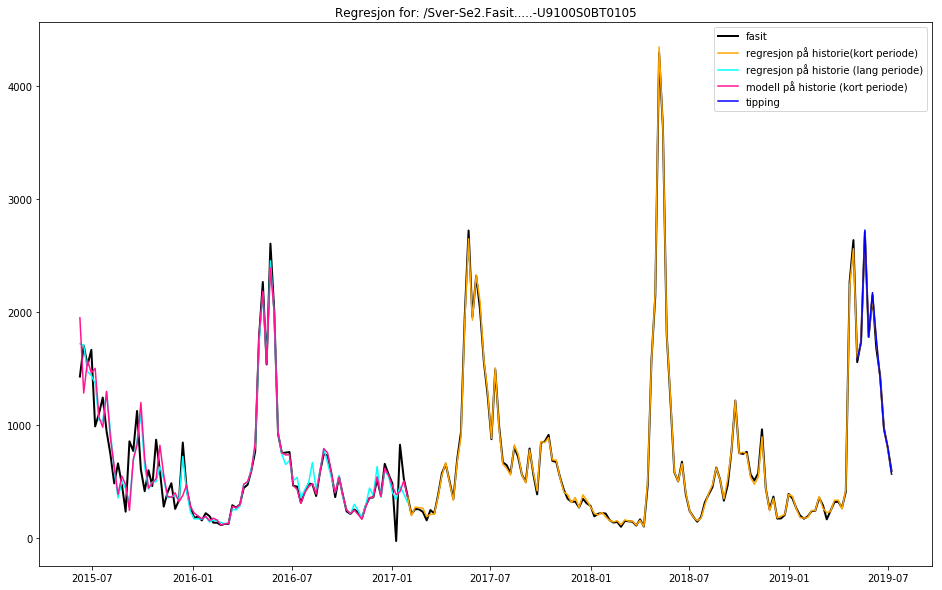

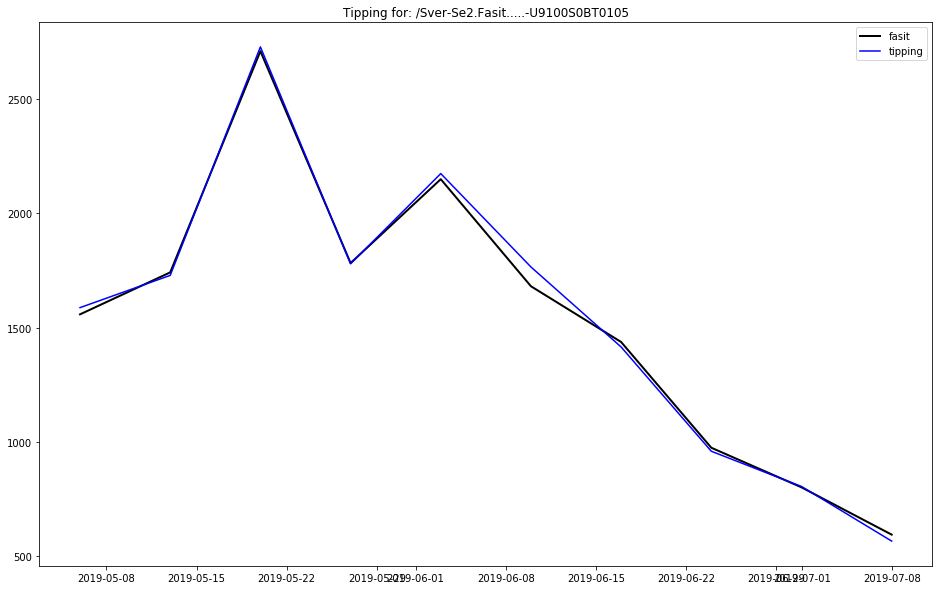

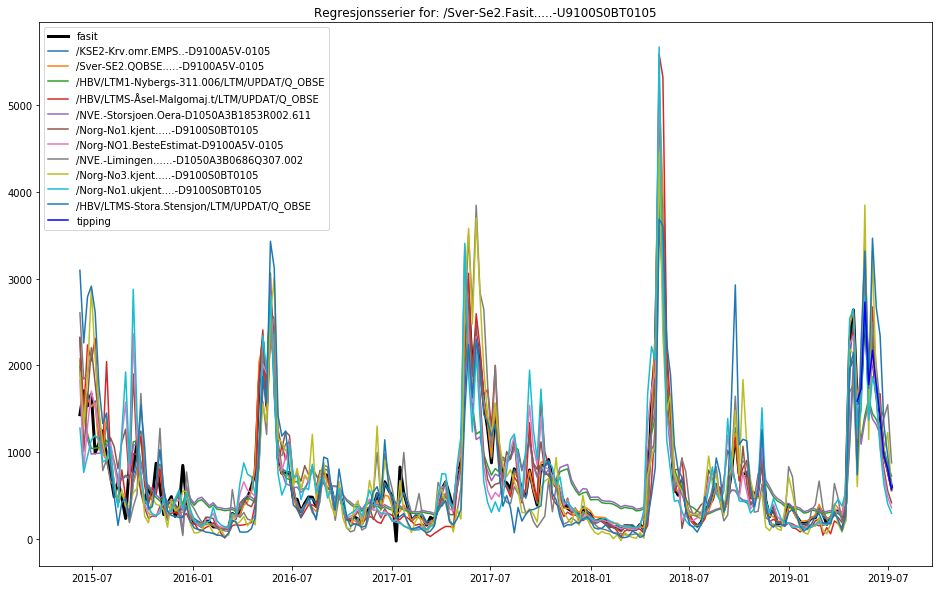


Skriver estimerte verdier til:  RegEstimatTilsigSE3-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE3.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se3.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.08.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.11.09 til: 2019.07.08, satt til 191 uker.
Valgte 159 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.96526
R2 mellom fasit og tipping: 0.98680

Fasit:
 2019-06-17 00:00:00+01:00    200.20950
2019-06-24 00:00:00+01:00    150.35335
2019-07-01 00:00:00+01:00    114.59656
2019-07-08 00:00:00+01:00     81.32789
Freq: W-SUN, Name: /Sver-Se3.Fasit.....-U9100S0BT0105, dtype: float64

Moddelert/Tippet:
 2019-06-10 00:00:

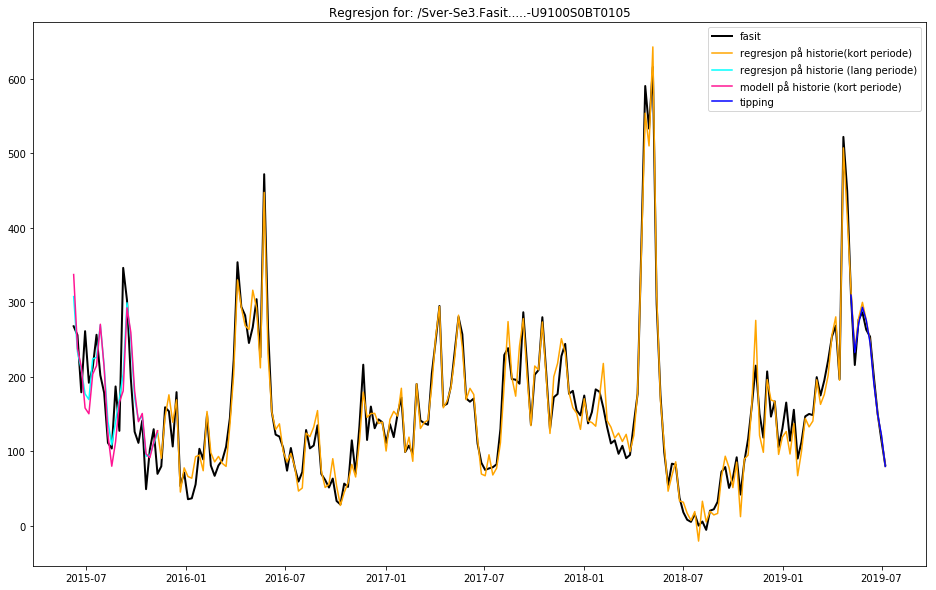

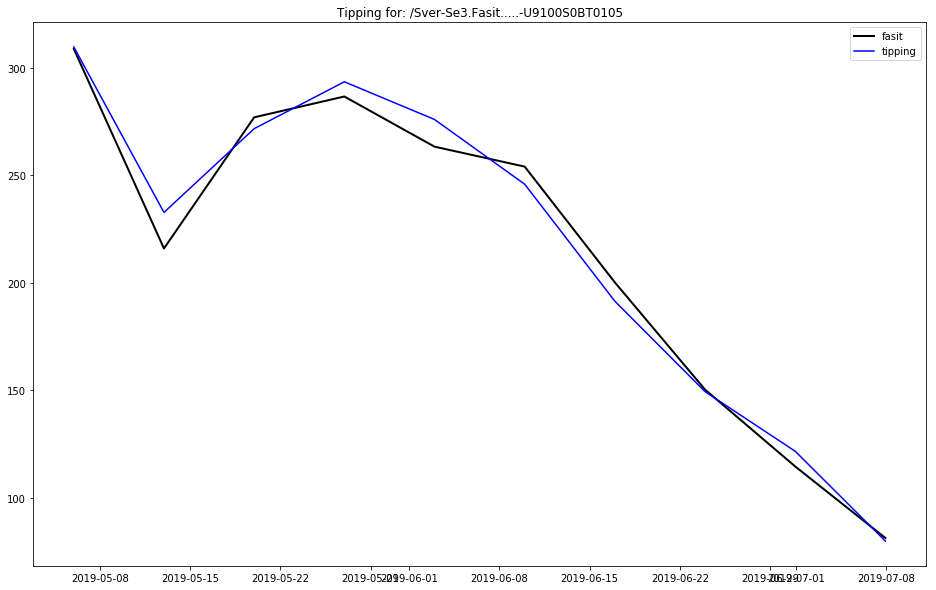

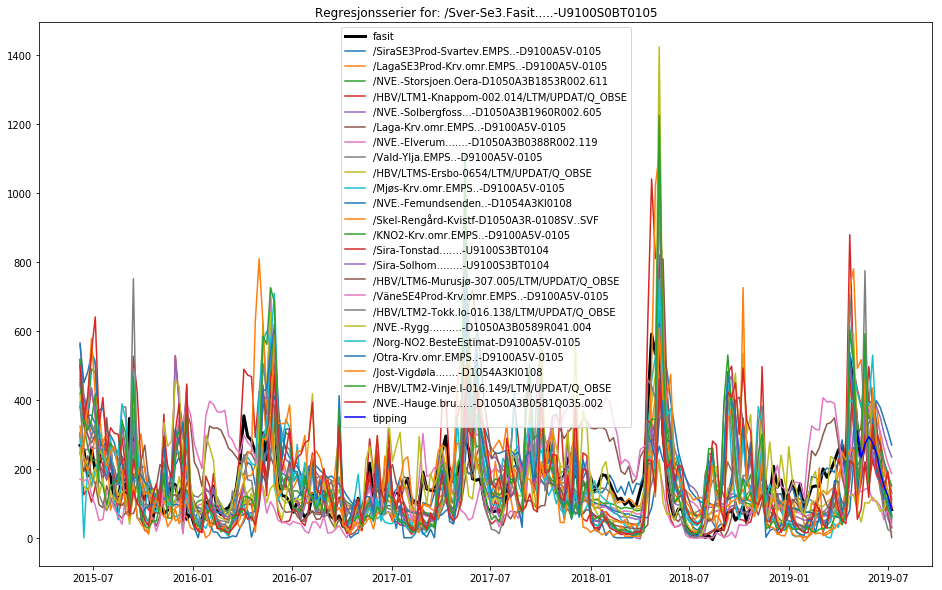


Skriver estimerte verdier til:  RegEstimatTilsigSE4-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE4.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se4.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.08.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2016.01.04 til: 2019.07.08, satt til 183 uker.
Valgte 156 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99009
R2 mellom fasit og tipping: 0.67578

Fasit:
 2019-06-17 00:00:00+01:00    12.049451
2019-06-24 00:00:00+01:00     5.209531
2019-07-01 00:00:00+01:00     5.996801
2019-07-08 00:00:00+01:00     8.152159
Freq: W-SUN, Name: /Sver-Se4.Fasit.....-U9100S0BT0105, dtype: float64

Moddelert/Tippet:
 2019-06-10 00:00:

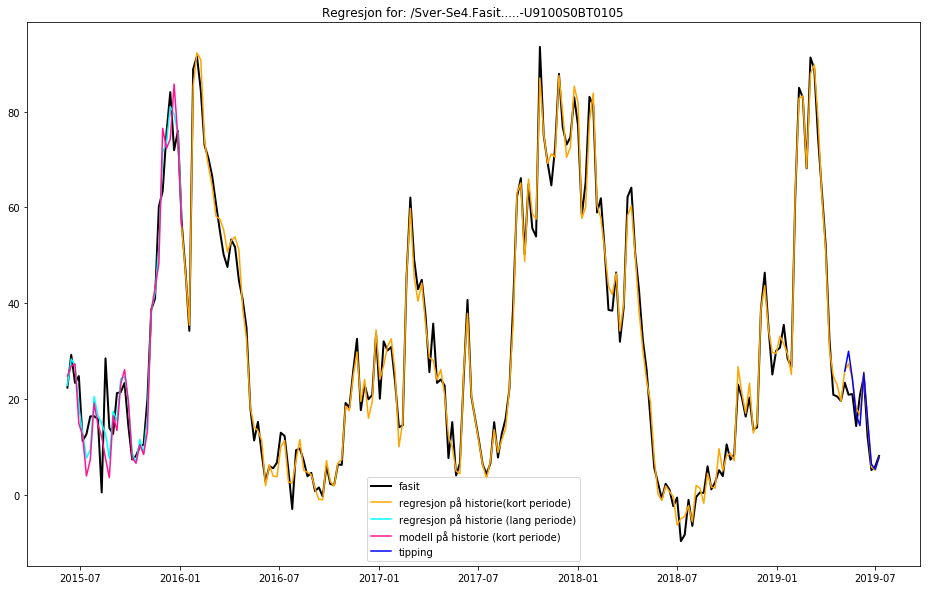

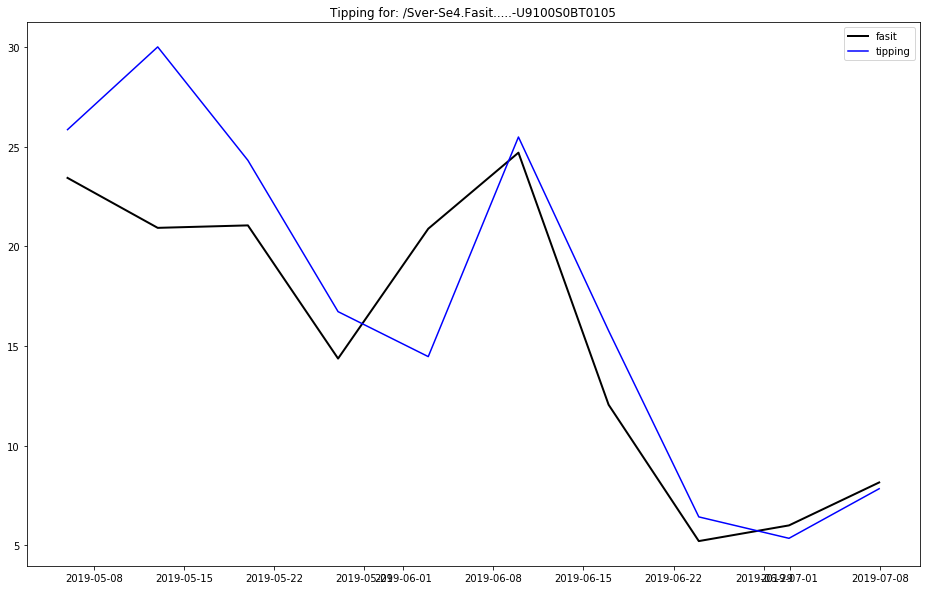

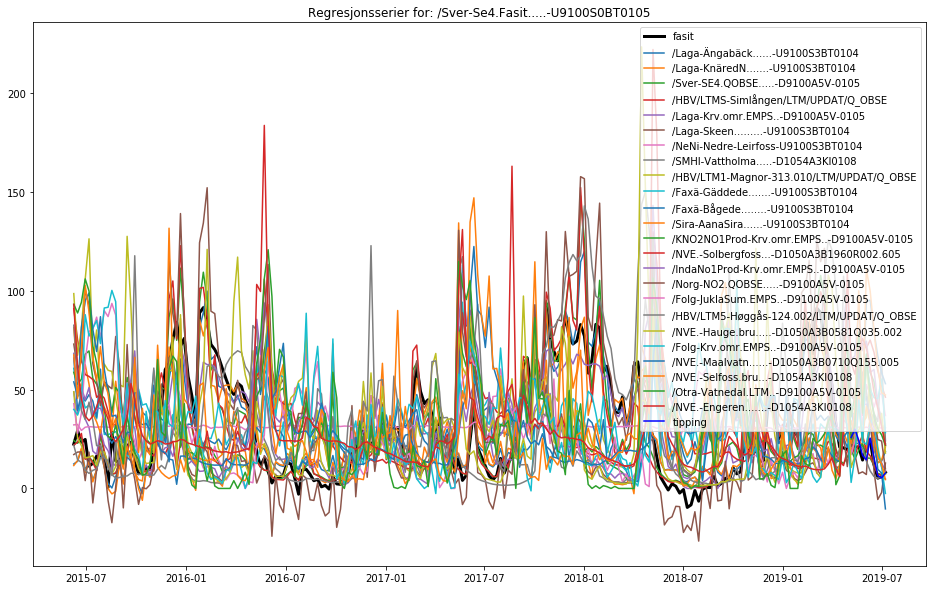


The script ran successfully and used a total of 2 minutes



In [5]:
from datetime import datetime
start_time = utctime_now()

for variable in ['magasin', 'tilsig']:
    df_week, MagKap, period, forecast_time, read_start = auto_input[variable]
    reg_end = (pd.to_datetime(time.strftime(forecast_time), format="%Y.%m.%d") - Timedelta(days=7)).strftime(
        '%Y.%m.%d')
    if (0 <= today.weekday() <= 1) or (today.weekday() == 2 and today.hour < 14):  # True for tipping
        last_forecast = forecast_time
    else:
        last_forecast = reg_end
    df_cleaned = deletingNaNs(df_week.loc[:last_forecast])
    for region in ['NO1', 'NO2', 'NO3', 'NO4', 'NO5', 'SE1', 'SE2', 'SE3', 'SE4']:
        start_time_loop = utctime_now()
        fasit, fasit_key = make_fasit(variable, region, reg_end, period)
        sorted_r2 = get_R2_sorted(variable, df_cleaned, fasit, fasit_key)
        short_period, max_p, ant_kandidater, input_file = get_input_variables_from_file(variable, region, backup=False)
        chosen_r2 = sorted_r2[:ant_kandidater]
        input1 = make_estimate(df_cleaned, fasit, fasit_key, last_forecast, short_period, max_p, chosen_r2, loop=False)
        fasit, long_results, short_results, df_tot, chosen_p, chosen_r2, r2_modelled, prediction, tipping_df, short_period, nb_weeks_tipping = input1
        input2 = fasit_key, ant_kandidater, max_p, reg_end, read_start
        # write to SMG:
        write_SMG_regresjon(variable, region, tipping_df)
        # write to SMG, virtual:
        write_V_SMG_Regresjon(df_tot, short_results, chosen_p, fasit_key, r2_modelled, MagKap)
        show_result_jupyter(input1, input2)
print('\nThe script ran successfully and used a total of %.0f minutes\n' %((utctime_now() - start_time)/60))
